<table align="left">
    <td>
      <a href="https://console.cloud.google.com/ai-platform/notebooks/deploy-notebook?name=BigQuery%20ML%20-%20Retail%20Demand%20Forecasting&download_url=https://21a7005b5b6f3f11-dot-us-west1.notebooks.googleusercontent.com/lab/workspaces/auto-J/tree/imported/bqml_test.ipynb">
        <img src="https://cloud.google.com/images/products/ai/ai-solutions-icon.svg" alt="AI Platform Notebooks">Run on AI Platform Notebooks</a>
    </td>
  <td>
    <a href="https://github.com/GoogleCloudPlatform/analytics-componentized-patterns/tree/master/retail/time-series/bqml-demand-forecasting/">
      <img src="https://cloud.google.com/ml-engine/images/github-logo-32px.png" alt="GitHub logo">
      View on GitHub
    </a>
  </td>
</table>

# Build a time-seried forecasting model and make it more practical by using BigQuery ML
### by JeongMin Kwon (cojette@gmail.com)

This notebook shows you how to train, deploy, evaluate a time series model, and some application for time-series forecasting by using BigQuery ML. 
Using the public [Iowa Liquor Sales data](https://console.cloud.google.com/marketplace/details/obfuscated-ga360-data/obfuscated-ga360-data?filter=solution-type:dataset) dataset, you use a single SQL query to create multiple time series models, where each model forecasts the retail sales of a single liquor product. 

By the end of this notebook, you will know how to:
* Pre-process time series data into the correct format needed to create the model.
* Train the time series model in BigQuery ML.
* Evaluate the model.
* Make predictions about future demand using the model.
* Find a trend, seasonality, holidy effects of each time-series data
* Check stationary and autocorrelation, as a basic characteristics of time-series data
* Check causal inferences of a point with decomposed time-series data. 

## Setup

Install the required packages, configure the environment variables, and create a BigQuery dataset.

### PIP Install Packages and dependencies

In [2]:
!pip install google-cloud-bigquery google-cloud-bigquery-storage --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 4.3 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: google-cloud-bigquery
    Found existing installation: google-cloud-bigquery 2.34.4
    Uninstalling google-cloud-bigquery-2.34.4:
      Successfully uninstalled google-cloud-bigquery-2.34.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-aiplatform 1.18.2 requires google-cloud-bigquery<3.0.0dev,>=1.15.0, but you have google-cloud-bigquery 3.4.0 which is incompatible.


In [2]:
# Automatically restart kernel after installs ## 할 필요 없음
import IPython
app = IPython.Application.instance()
app.kernel.do_shutdown(True)  

{'status': 'ok', 'restart': True}

### Configure GCP environment settings

Update the following variables to reflect the values for your GCP environment:

* PROJECT_ID: The ID of the Google Cloud project you are using to implement this solution.
* REGION: The region to use for the BigQuery dataset.

In [2]:

PROJECT_ID = 'independent-way-341912' # Change to your project.
REGION = 'US'

### Import libraries and define constants

In [1]:
from google.cloud import bigquery
import pandas as pd
from datetime import datetime, timedelta

pd.set_option('display.float_format', lambda x: '%.3f' % x)

### Function for data manipulation and plotting

In [160]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_historical_and_forecast(input_timeseries, 
                                 timestamp_col_name, 
                                 data_col_name, 
                                 forecast_output=None, 
                                 actual=None, 
                                 title=None,
                                 plotstartdate=None):

    if plotstartdate:
        input_timeseries = input_timeseries[pd.to_datetime(input_timeseries[timestamp_col_name]) >= pd.to_datetime(plotstartdate)]
    input_timeseries = input_timeseries.sort_values(timestamp_col_name)    
    
    # Plot the input historical data
    plt.figure(figsize=(20,6))
    plt.plot(input_timeseries[timestamp_col_name], input_timeseries[data_col_name], label = 'Historical')
    plt.xlabel(timestamp_col_name)
    plt.ylabel(data_col_name)

    if forecast_output is not None:
        forecast_output = forecast_output.sort_values('forecast_timestamp')
        forecast_output['forecast_timestamp'] = pd.to_datetime(forecast_output['forecast_timestamp'])
        x_data = forecast_output['forecast_timestamp']
        y_data = forecast_output['forecast_value']
        confidence_level = forecast_output['confidence_level'].iloc[0] * 100
        low_CI = forecast_output['confidence_interval_lower_bound']
        upper_CI = forecast_output['confidence_interval_upper_bound']
        # Plot the forecast data
        plt.plot(x_data, y_data, alpha = 1, label = 'Forecast', linestyle='--')
        # Shade the confidence interval
        plt.fill_between(x_data, low_CI, upper_CI, color = '#539caf', alpha = 0.4, 
                         label = f'{confidence_level} confidence interval')

    # Plot actual data
    if actual is not None:
        #actual = actual.sort_values(timestamp_col_name)
        actual = actual.sort_values('date')
        #plt.plot(actual[timestamp_col_name], actual[data_col_name], label = 'Actual', linestyle='--')   
        plt.plot(actual['date'], actual["total_amount_sold"], label = 'Actual', linestyle='--')   

    # Display title, legend
    plt.title(f'{title}', fontsize= 16)
    plt.legend(loc = 'upper center', prop={'size': 16})

### Create a BigQuery dataset

Create a dataset in your project called `bqmltest`:

In [4]:
!bq mk --location=$REGION --dataset $PROJECT_ID:bqmlforecast

BigQuery error in mk operation: Dataset 'independent-way-341912:bqmlforecast'
already exists.


## Prepare the training data

You train the time series models on a dataset containing transactional data. Each row represents a transaction on a single product, as identified by the `item_description` value, and contains details such as the number of bottles sold and the sales amount in dollars. In following steps, you use the number of bottles sold value to forecast product demand.

_Note_: Jupyter runs cells starting with %%bigquery as SQL queries

In [46]:
%%bigquery --project $PROJECT_ID

SELECT 
    invoice_and_item_number,
    date,
    store_number,
    item_description,
    bottles_sold,
    sale_dollars
FROM
  `bigquery-public-data.iowa_liquor_sales.sales` 
LIMIT 
  20

Query is running:   0%|          |

Downloading:   0%|          |

,invoice_and_item_number,date,store_number,item_description,bottles_sold,sale_dollars
0,INV-43744900024,2022-01-12,4499,JAGERMEISTER LIQUEUR MINI MEISTERS,1,7.400
1,INV-23979200038,2019-12-17,3723,JAGERMEISTER LIQUEUR MINI MEISTERS,1,7.400
2,INV-41405900003,2021-10-27,5069,JAGERMEISTER LIQUEUR MINI MEISTERS,1,7.400
3,INV-28342900050,2020-06-29,4559,JAGERMEISTER LIQUEUR MINI MEISTERS,1,7.400
4,INV-21733200010,2019-09-05,5057,JAGERMEISTER MINI MEISTERS,1,7.400
5,INV-39520200103,2021-08-25,6180,JAGERMEISTER LIQUEUR MINI MEISTERS,1,7.400
6,INV-18537200354,2019-04-03,2603,SALVADORS CLASSIC MARGARITA 4PK SLIM CANS,6,45.000
7,INV-27653700005,2020-06-02,5933,PATRON SILVER SPECIAL TIN,24,990.000
8,INV-32324500028,2020-11-30,5916,JIM BEAM W/2 GLASSES,24,378.000
9,INV-15329200004,2018-10-29,2538,JACK DANIELS W/GLASS,24,560.640


In [8]:
%%bigquery --project $PROJECT_ID

#data check 
SELECT COUNT(1), max(date) as max_date, min(date) as min_date
FROM `bigquery-public-data.iowa_liquor_sales.sales` 

Query is running:   0%|          |

Downloading:   0%|          |

,f0_,max_date,min_date
0,25060495,2022-10-31,2012-01-03


### Set the start and end dates for the training data

You can adjust the `TRAININGDATA_STARTDATE` and `TRAININGDATA_ENDDATE` parameters to specify the start/end dates of your training data:

In [9]:
ARIMA_PARAMS = {
    'TRAININGDATA_STARTDATE': '2016-01-01',
    'TRAININGDATA_ENDDATE': '2019-06-01',
}
ARIMA_PARAMS

{'TRAININGDATA_STARTDATE': '2016-01-01', 'TRAININGDATA_ENDDATE': '2019-06-01'}

### Write the training data to a table

If you review the training data, you can observe that some days have no transactions for a given product. To keep you from having to do additional pre-processing, BigQuery ML automatically handles the following situations:

* Missing values: Values are imputed using local [linear interpolation](https://en.wikipedia.org/wiki/Linear_interpolation).
* Duplicated timestamps: Values are averaged across duplicated timestamps.
* Spike and dip anomalies: Values are standardized using local [z-scores](https://en.wikipedia.org/wiki/Standard_score).

In [47]:
%%bigquery --params $ARIMA_PARAMS  --project $PROJECT_ID 

CREATE OR REPLACE TABLE bqmlforecast.training_data AS (
    WITH topsellingitems AS(
         SELECT 
            item_description,
            count(item_description) cnt_transactions
        FROM
            `bigquery-public-data.iowa_liquor_sales.sales` 
        GROUP BY 
            item_description
        ORDER BY cnt_transactions DESC
        LIMIT 7 #Top N
    )
    SELECT 
        date,
        item_description AS item_name,
        SUM(bottles_sold) AS total_amount_sold
    FROM
        `bigquery-public-data.iowa_liquor_sales.sales` 
    GROUP BY
        date, item_name
    HAVING 
        date BETWEEN @TRAININGDATA_STARTDATE AND @TRAININGDATA_ENDDATE
        AND item_description IN (SELECT item_description FROM topsellingitems)
    );

SELECT 
    date,
    item_name,
    total_amount_sold
FROM 
    bqmlforecast.training_data 
ORDER BY item_name, date
LIMIT 10

Query is running:   0%|          |

Downloading:   0%|          |

,date,item_name,total_amount_sold
0,2016-01-04,BLACK VELVET,5014
1,2016-01-05,BLACK VELVET,5193
2,2016-01-06,BLACK VELVET,4422
3,2016-01-07,BLACK VELVET,3760
4,2016-01-11,BLACK VELVET,4492
5,2016-01-12,BLACK VELVET,4945
6,2016-01-13,BLACK VELVET,4302
7,2016-01-14,BLACK VELVET,3394
8,2016-01-15,BLACK VELVET,2318
9,2016-01-19,BLACK VELVET,4714


### Plot the sales histories of the target liquor products

Save the training data to the `dfhistorical` Pandas dataframe:

In [48]:
%%bigquery dfhistorical --project $PROJECT_ID 

SELECT 
    * 
FROM 
    bqmlforecast.training_data

Query is running:   0%|          |

Downloading:   0%|          |

Using the training data, plot the sales histories of the target liquor products:

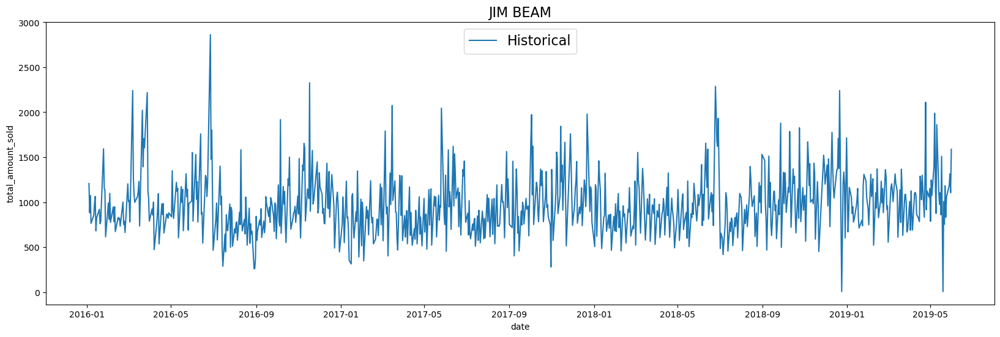

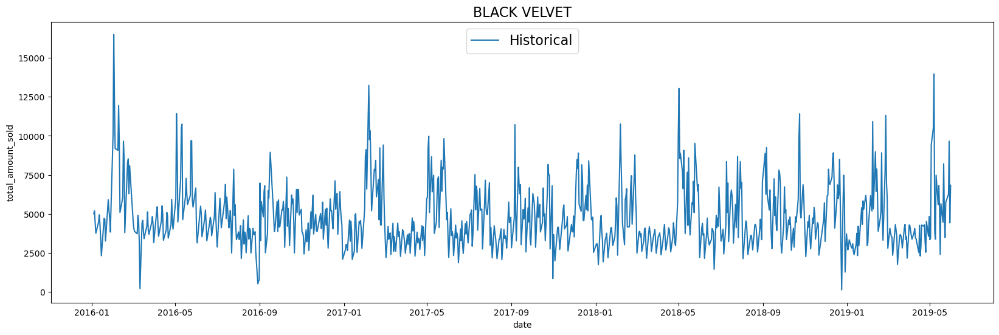

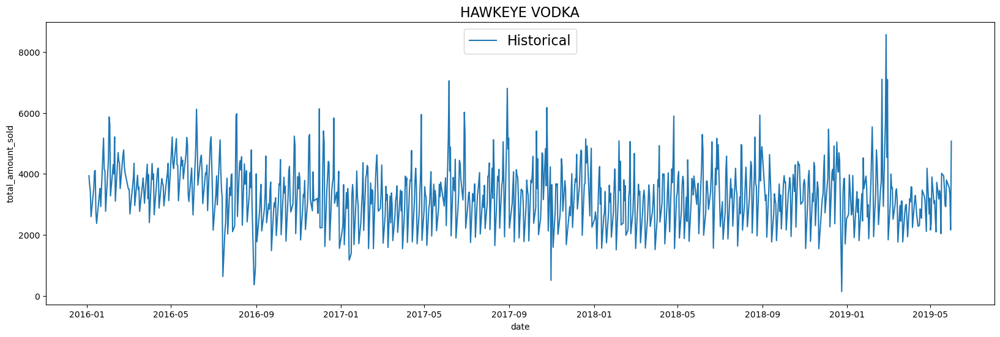

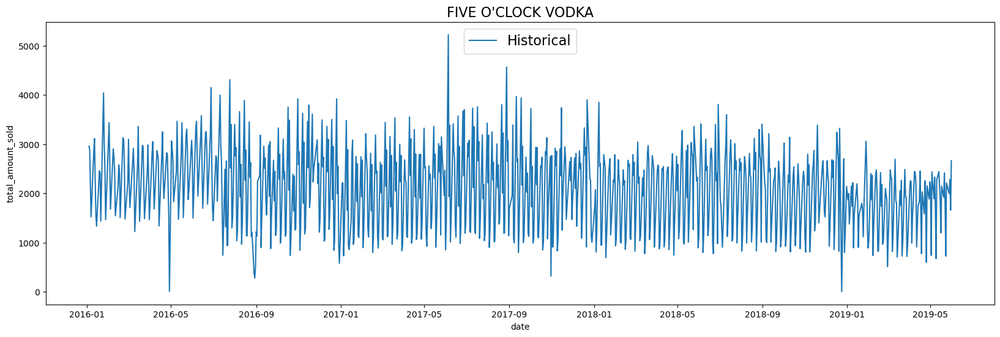

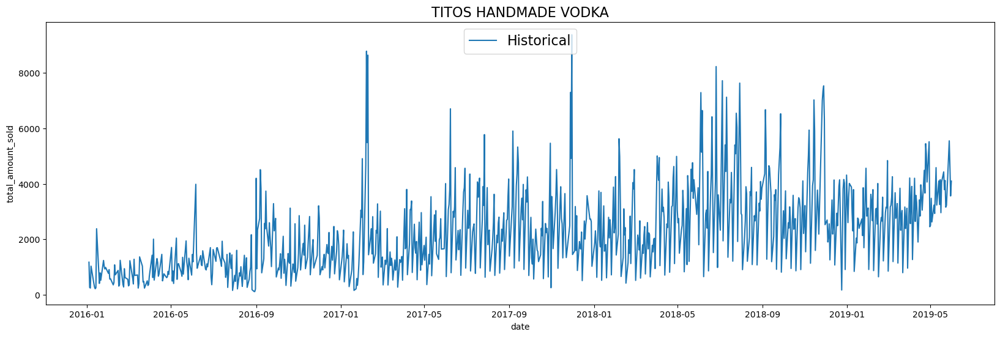

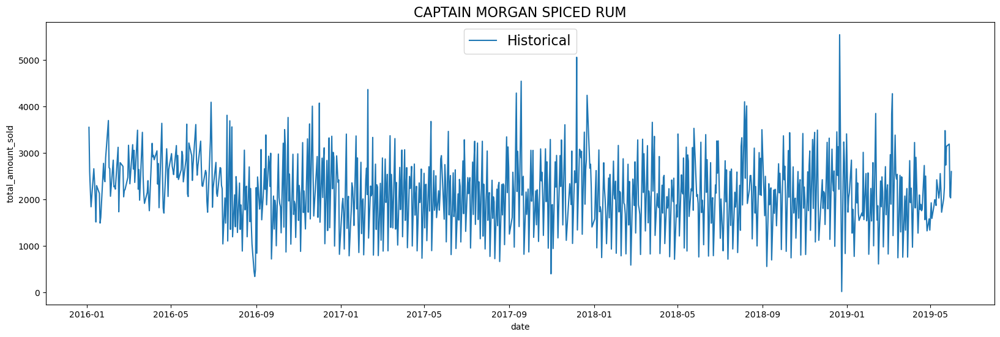

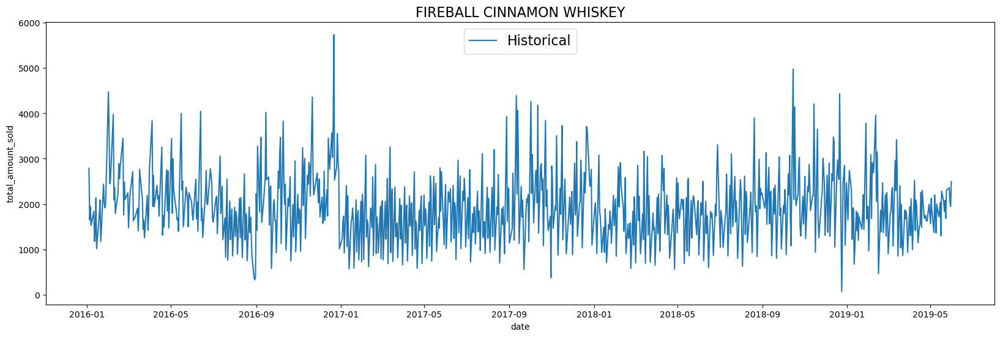

In [49]:
itemslist = list(dfhistorical.item_name.unique())

for item in itemslist:
    
    datah = dfhistorical[dfhistorical.item_name==item]
    plot_historical_and_forecast(input_timeseries = datah, 
                                 timestamp_col_name = "date", 
                                 data_col_name = "total_amount_sold", 
                                 forecast_output = None, 
                                 actual = None,
                                 title = item)

## Train the model

Because you are training the model on multiple products in a single model creation statement, you must specify the `item_name` column for the [TIME_SERIES_ID_COL](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-time-series#time_series_id_col) parameter. If you were only forecasting a single item, then you would not need to specify `TIME_SERIES_ID_COL`. For more information, see the [BigQuery ML time series model creation documentation](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-time-series#create_model_syntax).

You can also account for holiday effects when doing time series modeling in BigQuery ML. By default, holiday effects modeling is disabled. But since this data is from the United States, and the data includes a minimum one year of daily data, you can also specify an optional `HOLIDAY_REGION`. With holiday effects enabled, spikes and dips that appear during holidays will no longer be treated as anomalies. A full list of the holiday regions can be found in the [HOLIDAY_REGION documentation](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-time-series#holiday_region).



In [ ]:
## Just for compare

%%bigquery --project $PROJECT_ID 

CREATE OR REPLACE MODEL bqmlforecast.arima_model

OPTIONS(
  MODEL_TYPE='ARIMA',
  TIME_SERIES_TIMESTAMP_COL='date', 
  TIME_SERIES_DATA_COL='total_amount_sold',
  TIME_SERIES_ID_COL='item_name',
  HOLIDAY_REGION='US'
) AS

SELECT 
    date,
    item_name,
    total_amount_sold
FROM
  bqmlforecast.training_data

In [127]:
%%bigquery --project $PROJECT_ID 

CREATE OR REPLACE MODEL bqmlforecast.arima_plus_model

OPTIONS(
  MODEL_TYPE='ARIMA_PLUS',
  TIME_SERIES_TIMESTAMP_COL='date', 
  TIME_SERIES_DATA_COL='total_amount_sold',
  TIME_SERIES_ID_COL='item_name',
  HOLIDAY_REGION='US', 
  DECOMPOSE_TIME_SERIES = TRUE,
  CLEAN_SPIKES_AND_DIPS = TRUE, 
  TREND_SMOOTHING_WINDOW_SIZE = 7
) AS

SELECT 
    date,
    item_name,
    total_amount_sold
FROM
  bqmlforecast.training_data

Query is running:   0%|          |

""


### Evaluate the model

Use the [ML.EVALUATE](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-evaluate) function to see the evaluation metrics of all the created models. 

The `non_seasonal_`{`p`,`d`,`q`} and `has_drift` columns define the time series model. The `log_likelihood`, `AIC`, and `variance` columns are relevant to the model fitting process. The fitting process determines the best model by using the [auto.ARIMA algorithm](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-time-series#auto_arima), one for each time series.

In [87]:
%%bigquery --project $PROJECT_ID 

SELECT
  *
FROM
  ML.EVALUATE(MODEL bqmlforecast.arima_model)

Query is running:   0%|          |

Downloading:   0%|          |

,item_name,non_seasonal_p,non_seasonal_d,non_seasonal_q,has_drift,log_likelihood,AIC,variance,seasonal_periods
0,BLACK VELVET,2,1,2,False,-9799.631,19609.261,411585.600,"[WEEKLY, YEARLY]"
1,FIREBALL CINNAMON WHISKEY,0,1,5,True,-8889.825,17793.649,94810.723,"[WEEKLY, YEARLY]"
2,FIVE O'CLOCK VODKA,0,1,5,True,-8600.975,17215.950,59626.825,"[WEEKLY, YEARLY]"
3,HAWKEYE VODKA,0,1,5,False,-9027.391,18066.782,118557.430,"[WEEKLY, YEARLY]"
4,TITOS HANDMADE VODKA,0,1,5,True,-9395.563,18805.126,213485.988,"[WEEKLY, YEARLY]"


In [128]:
%%bigquery --project $PROJECT_ID 

SELECT
  *
FROM
  ML.ARIMA_EVALUATE(MODEL bqmlforecast.arima_plus_model)

Query is running:   0%|          |

Downloading:   0%|          |

,item_name,non_seasonal_p,non_seasonal_d,non_seasonal_q,has_drift,log_likelihood,AIC,variance,seasonal_periods,has_holiday_effect,has_spikes_and_dips,has_step_changes,error_message
0,BLACK VELVET,2,1,2,False,-9799.631,19609.261,411585.600,"[WEEKLY, YEARLY]",True,True,True,
1,CAPTAIN MORGAN SPICED RUM,2,1,2,True,-9087.923,18187.846,131045.199,[WEEKLY],True,True,True,
2,FIREBALL CINNAMON WHISKEY,0,1,5,True,-8889.825,17793.649,94810.723,"[WEEKLY, YEARLY]",True,False,True,
3,FIVE O'CLOCK VODKA,0,1,5,True,-8600.975,17215.950,59626.825,"[WEEKLY, YEARLY]",True,False,True,
4,HAWKEYE VODKA,0,1,5,False,-9027.391,18066.782,118557.430,"[WEEKLY, YEARLY]",True,True,True,
5,JIM BEAM,2,1,2,True,-7853.346,15718.692,17963.483,"[WEEKLY, YEARLY]",True,True,True,
6,TITOS HANDMADE VODKA,0,1,5,True,-9395.563,18805.126,213485.988,"[WEEKLY, YEARLY]",True,True,False,


You can see that five models were trained, one for each of the products in the `item_name` column. Each model has its own `p,d,q` hyperparameters, and the detected seasonality for these five models is `WEEKLY`.

## Make predictions using the model

Make predictions using [ML.FORECAST](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-forecast), which forecasts the next _n_ values, as specified in the `horizon` parameter. You can also optionally change the `confidence_level` parameter to change the percentage of future values that fall in the prediction interval. You save the prediction data to the `dfforecast` dataframe so that you can plot it in a following step.


In [17]:
## Just for Comapre old version

%%bigquery dfforecast --project $PROJECT_ID 

DECLARE HORIZON STRING DEFAULT "30"; #number of values to forecast
DECLARE CONFIDENCE_LEVEL STRING DEFAULT "0.90";

EXECUTE IMMEDIATE format("""
    SELECT
      *
    FROM 
      ML.FORECAST(MODEL bqmlforecast.arima_model, 
                  STRUCT(%s AS horizon, 
                         %s AS confidence_level)
                 )
    """,HORIZON,CONFIDENCE_LEVEL)

Query is running:   0%|          |

Downloading:   0%|          |

In [22]:
dfforecast.tail()

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
145,TITOS HANDMADE VODKA,2019-06-26 00:00:00+00:00,4406.211,654.597,0.900,3330.661,5481.761,3330.661,5481.761
146,TITOS HANDMADE VODKA,2019-06-27 00:00:00+00:00,3799.956,654.597,0.900,2724.406,4875.506,2724.406,4875.506
147,TITOS HANDMADE VODKA,2019-06-28 00:00:00+00:00,2680.247,654.597,0.900,1604.697,3755.796,1604.697,3755.796
148,TITOS HANDMADE VODKA,2019-06-29 00:00:00+00:00,4906.735,654.597,0.900,3831.185,5982.284,3831.185,5982.284
149,TITOS HANDMADE VODKA,2019-06-30 00:00:00+00:00,4387.122,654.597,0.900,3311.573,5462.672,3311.573,5462.672


In [219]:
%%bigquery dfforecast_plus --project $PROJECT_ID 

DECLARE HORIZON STRING DEFAULT "100"; #number of values to forecast
DECLARE CONFIDENCE_LEVEL STRING DEFAULT "0.90";

EXECUTE IMMEDIATE format("""
    SELECT
      *
    FROM 
      ML.FORECAST(MODEL bqmlforecast.arima_plus_model, 
                  STRUCT(%s AS horizon, 
                         %s AS confidence_level)
                 )
    """,HORIZON,CONFIDENCE_LEVEL)

Query is running:   0%|          |

Downloading:   0%|          |

In [108]:
dfforecast_plus.tail()

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
1045,TITOS HANDMADE VODKA,2019-10-24 00:00:00+00:00,3419.397,654.598,0.900,2343.846,4494.947,2343.846,4494.947
1046,TITOS HANDMADE VODKA,2019-10-25 00:00:00+00:00,2953.950,654.598,0.900,1878.399,4029.501,1878.399,4029.501
1047,TITOS HANDMADE VODKA,2019-10-26 00:00:00+00:00,3239.879,654.598,0.900,2164.328,4315.430,2164.328,4315.430
1048,TITOS HANDMADE VODKA,2019-10-27 00:00:00+00:00,3844.948,654.598,0.900,2769.398,4920.499,2769.398,4920.499
1049,TITOS HANDMADE VODKA,2019-10-28 00:00:00+00:00,4598.746,654.598,0.900,3523.195,5674.296,3523.195,5674.296


In [221]:
print(f"Number of rows: {dfforecast_plus.shape[0]}") #horizon * number of liquors (7)

Number of rows: 700


In [23]:
# for comparing old ARIMA and ARIMA+
comp = pd.concat([dfforecast, dfforecast_plus]).drop_duplicates(keep=False)
comp

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound


#### Inspect the model coefficients

You can view the coefficients of each of the time series models using [ML.ARIMA_COEFFICIENTS](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-arima-coefficients).

For each of the models, the `ar_coefficients` value shows the model coefficients of the autoregressive (AR) part of the time series model. Similarly, the `ma_coefficients` value shows the model coefficients of the moving-average (MA) part of the model. Both of these values are arrays, and their lengths are equal to `non_seasonal_p` and `non_seasonal_q`, respectively. The `intercept_or_drift` value is the constant term in the time series model.

In [109]:
%%bigquery --project $PROJECT_ID 

SELECT
  *
FROM 
  ML.ARIMA_COEFFICIENTS(MODEL bqmlforecast.arima_plus_model)

Query is running:   0%|          |

Downloading:   0%|          |

,item_name,ar_coefficients,ma_coefficients,intercept_or_drift
0,BLACK VELVET,"[-0.29726210627254973, 0.5554256959411269]","[-0.14925540783907892, -0.8309011185163795]",0.000
1,CAPTAIN MORGAN SPICED RUM,"[-0.25470611190938225, 0.5268444528328584]","[-0.17315001522338622, -0.7817319775068824]",-0.264
2,FIREBALL CINNAMON WHISKEY,[],"[-0.5510346570387226, -0.5698131349234568, 0.6...",-0.174
3,FIVE O'CLOCK VODKA,[],"[-0.585255319805574, 0.14772834127876477, -0.7...",-0.415
4,HAWKEYE VODKA,[],"[-0.4516961509741882, 0.09063177898028653, -0....",0.000
5,JIM BEAM,"[-0.24007775198018014, 0.5012255067891459]","[-0.1966494455624323, -0.7866032804318563]",0.149
6,TITOS HANDMADE VODKA,[],"[-0.6500434591213643, -0.41652276063201826, 0....",2.220


In [110]:
%%bigquery dfforcast_result --project $PROJECT_ID 

SELECT
  *
FROM 
  ML.EXPLAIN_FORECAST(MODEL bqmlforecast.arima_plus_model)

Query is running:   0%|          |

Downloading:   0%|          |

In [111]:
dfforcast_result.head()

,item_name,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,seasonal_period_yearly,seasonal_period_quarterly,seasonal_period_monthly,seasonal_period_weekly,seasonal_period_daily,holiday_effect,spikes_and_dips,step_changes
0,BLACK VELVET,2016-01-04 00:00:00+00:00,history,5014.000,5014.000,641.549,NaN,NaN,NaN,2419.791,-1485.809,NaN,NaN,669.190,NaN,0.000,0.000,0.000
1,BLACK VELVET,2016-01-05 00:00:00+00:00,history,5193.000,5302.728,641.549,NaN,NaN,NaN,3216.001,-1496.538,NaN,NaN,968.649,NaN,0.000,0.000,0.000
2,BLACK VELVET,2016-01-06 00:00:00+00:00,history,4422.000,4994.449,641.549,NaN,NaN,NaN,4021.818,-1133.605,NaN,NaN,376.234,NaN,0.000,0.000,0.000
3,BLACK VELVET,2016-01-07 00:00:00+00:00,history,3760.000,3507.665,641.549,NaN,NaN,NaN,4790.467,-860.879,NaN,NaN,-987.555,NaN,0.000,0.000,0.000
4,BLACK VELVET,2016-01-08 00:00:00+00:00,history,3943.000,3948.102,641.549,NaN,NaN,NaN,5578.526,-712.678,NaN,NaN,-912.692,NaN,0.000,0.000,0.000


#### Plot the forecasted predictions against the historical data

Plot the forecasted predictions, using the `dfhistorical` dataframe that contains the historical data that you used for training and the `dfforecast_plus` dataframe that contains the prediction data:

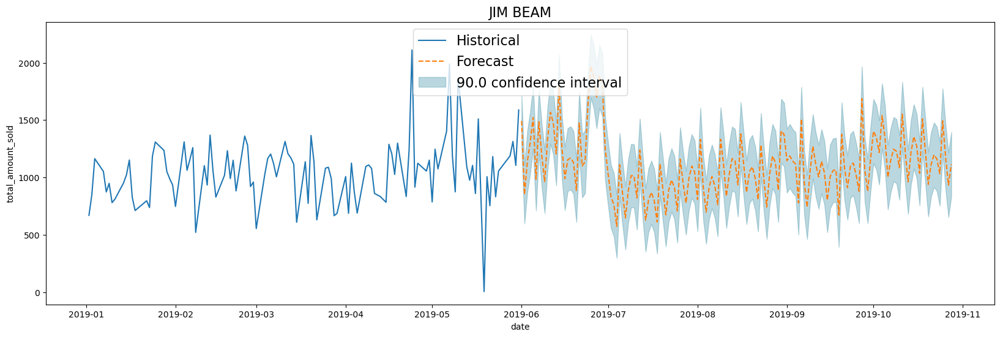

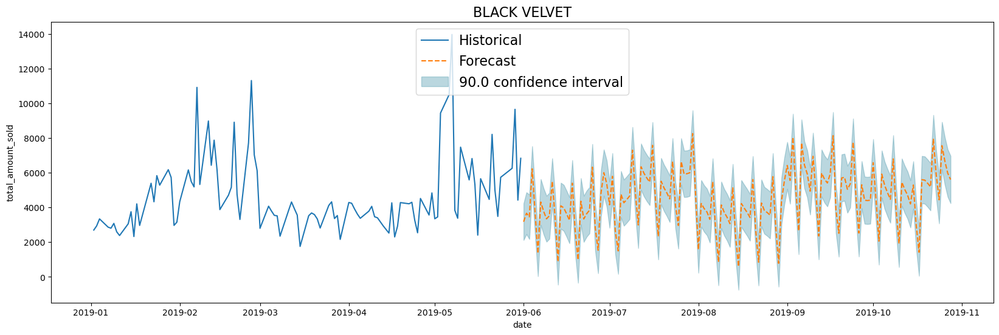

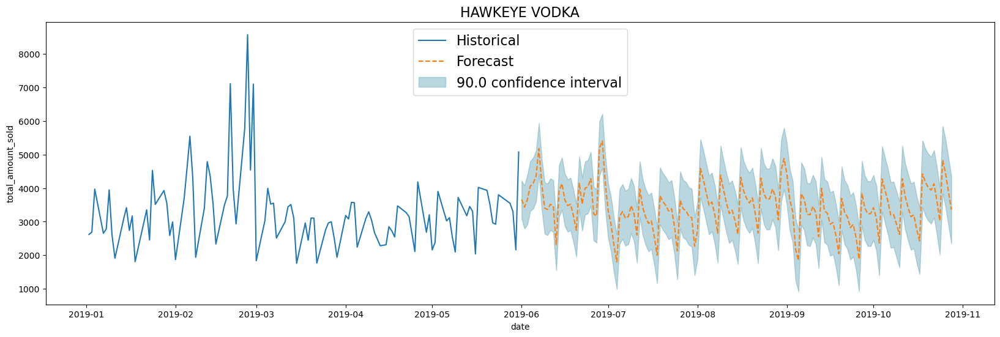

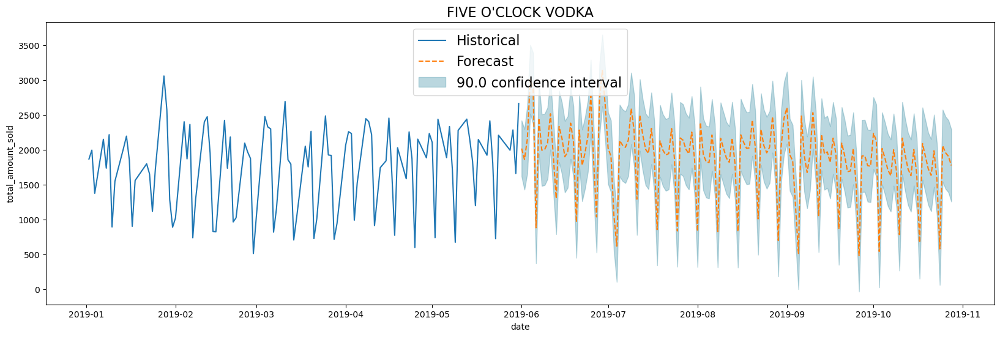

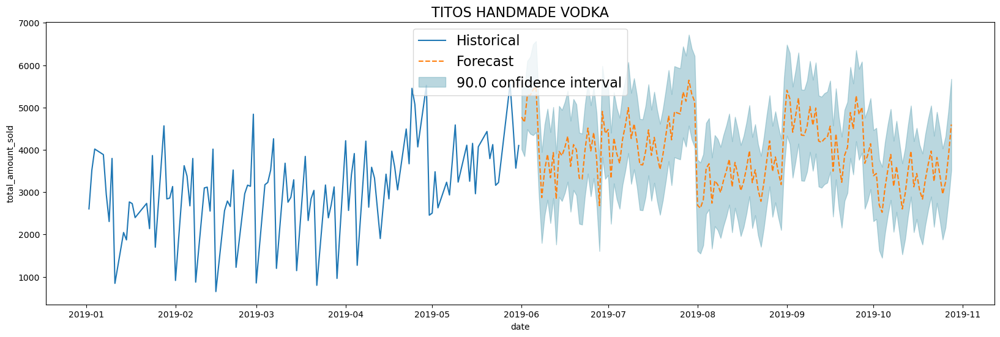

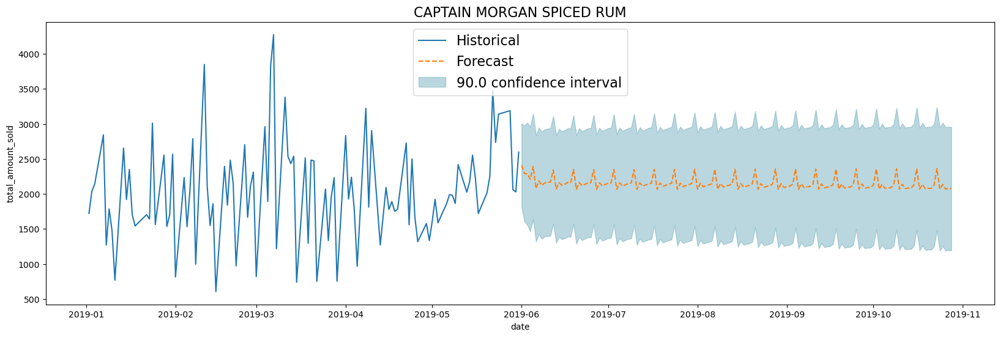

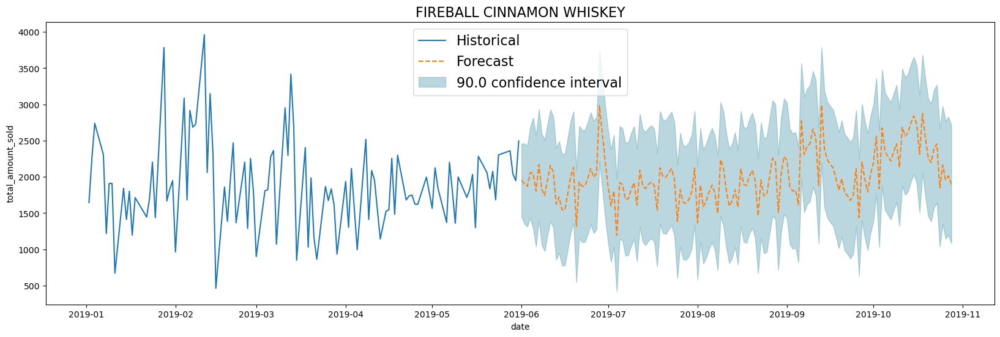

In [112]:
itemslist = list(dfhistorical.item_name.unique())

for item in itemslist:
    datah = dfhistorical[dfhistorical.item_name==item]
    dataf = dfforecast_plus[dfforecast_plus.item_name==item]
    
    plot_historical_and_forecast(input_timeseries = datah, 
                                 timestamp_col_name = "date", 
                                 data_col_name = "total_amount_sold", 
                                 forecast_output = dataf, 
                                 actual = None,
                                 title = item,
                                 plotstartdate = "2019-01-01")

#### Plot the forecasted predictions against the actual data

Save the actual sales data to the `dfactual` Pandas dataframe:

In [222]:
%%bigquery dfactual --params $ARIMA_PARAMS --project $PROJECT_ID 

DECLARE HORIZON STRING DEFAULT "100"; #number of values to forecast

SELECT 
    date,
    item_description AS item_name,
    SUM(bottles_sold) AS total_amount_sold
FROM
    `bigquery-public-data.iowa_liquor_sales.sales` 
GROUP BY
    date, item_name
HAVING 
    date BETWEEN DATE_ADD(@TRAININGDATA_ENDDATE, 
                              INTERVAL 1 DAY) 
            AND DATE_ADD(@TRAININGDATA_ENDDATE, 
                             INTERVAL 1+CAST(HORIZON AS INT64) DAY) 
ORDER BY
    date;

Query is running:   0%|          |

Downloading:   0%|          |

In [100]:
dfactual.head()

,date,item_name,total_amount_sold
0,2019-06-03,JOSE CUERVO AUTHENTIC LIGHT LIME MARGARITA,42
1,2019-06-03,JOSE CUERVO AUTHENTIC PINK LEMONADE MARGARITA,37
2,2019-06-03,SOUTHERN COMFORT PET,93
3,2019-06-03,TRADER VICS PRIVATE SELECTION SPICED RUM,35
4,2019-06-03,BARTON LIGHT RUM,72


Plot the forecasted predictions against the training data and actual values, using the `dfhistorical` dataframe that contains the historical data, the `dfforecast_plus` dataframe that contains the prediction data, and the `dfactual` dataframe that contains the actual sales data:

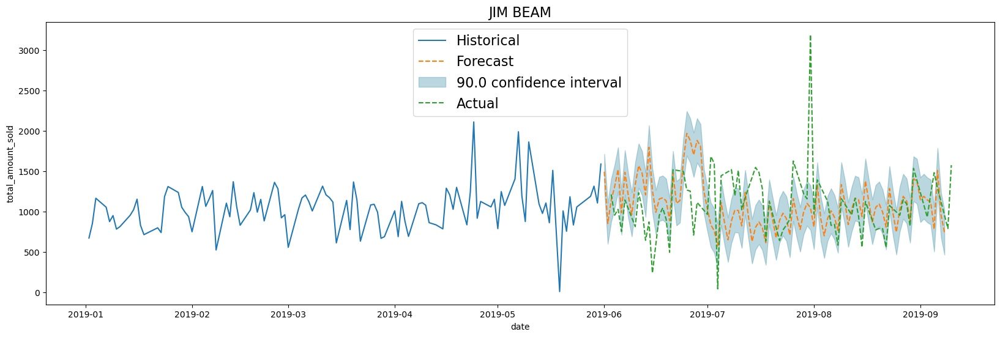

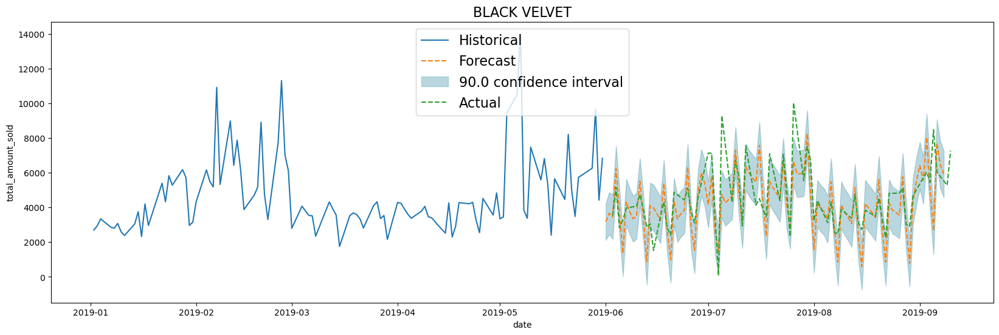

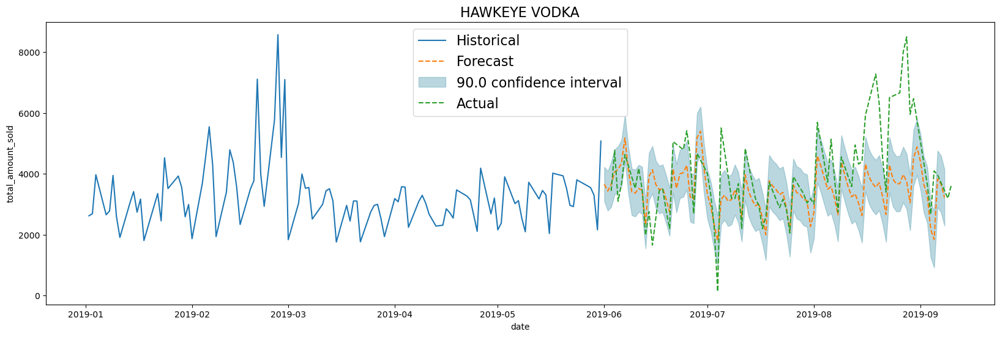

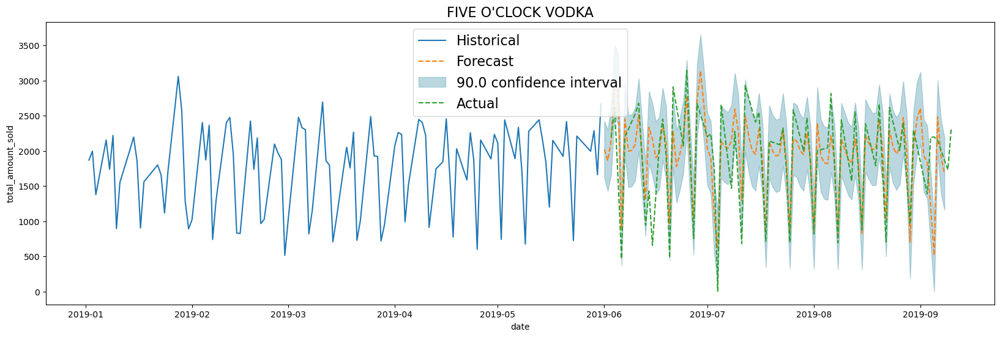

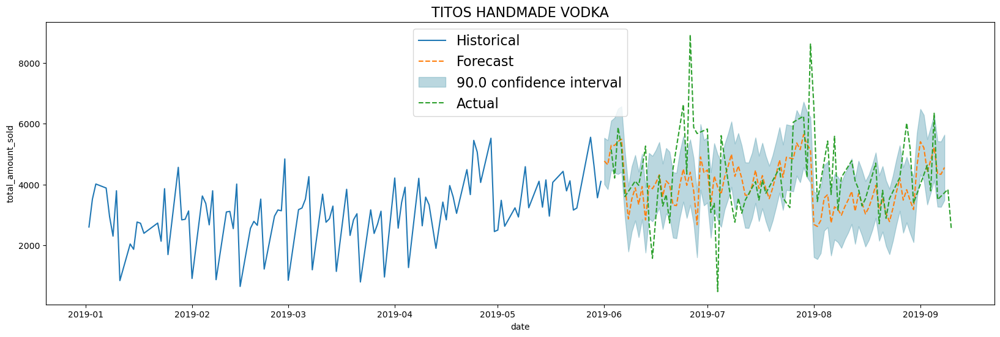

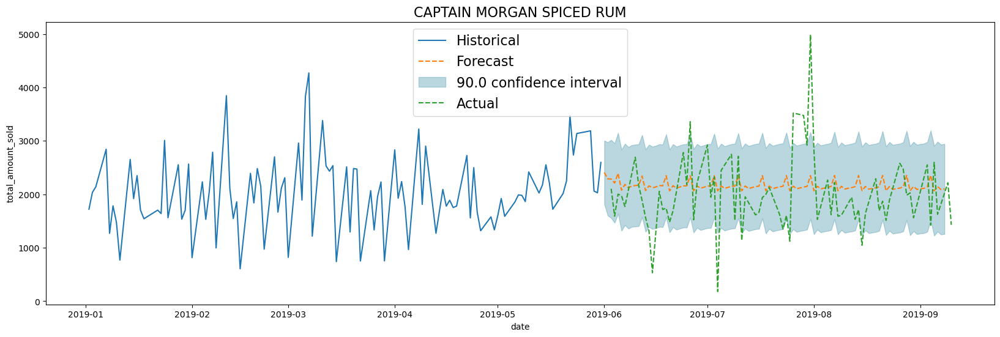

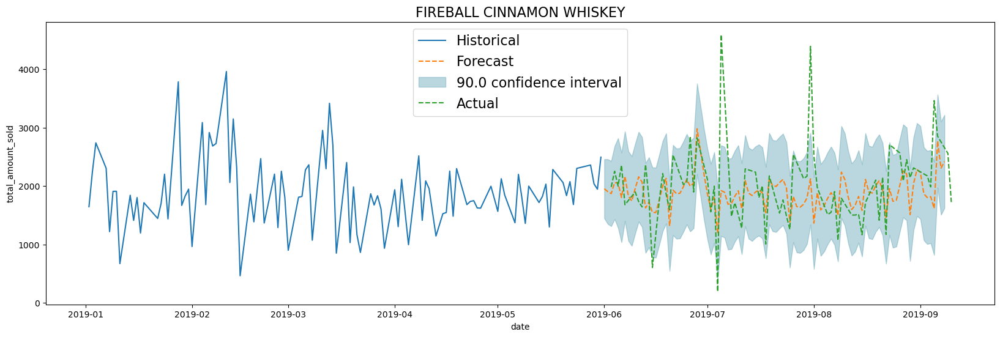

In [223]:
itemslist = list(dfhistorical.item_name.unique())

for item in itemslist:
    datah = dfhistorical[dfhistorical.item_name==item].sort_values('date')
    dataf = dfforecast_plus[dfforecast_plus.item_name==item].sort_values(['forecast_timestamp'])
    dataa = dfactual[dfactual.item_name==item].sort_values('date')
    plot_historical_and_forecast(input_timeseries = datah, 
                             timestamp_col_name = "date", 
                             data_col_name = "total_amount_sold", 
                             forecast_output = dataf, 
                             actual = dataa,
                             title = item,
                             plotstartdate = "2019-01-01")

## Show the Trend, Seasonal, Holiday Effects

See decomposed trend, seasonal effect, and holiday effects. 


In [135]:
dfforcast_result.tail()

,item_name,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,seasonal_period_yearly,seasonal_period_quarterly,seasonal_period_monthly,seasonal_period_weekly,seasonal_period_daily,holiday_effect,spikes_and_dips,step_changes
8724,TITOS HANDMADE VODKA,2019-05-30 00:00:00+00:00,history,3566.000,3446.271,462.045,NaN,NaN,NaN,4032.108,-132.765,NaN,NaN,-274.329,NaN,0.000,0.000,NaN
8725,TITOS HANDMADE VODKA,2019-05-31 00:00:00+00:00,history,4102.000,4496.183,462.045,NaN,NaN,NaN,4136.702,634.330,NaN,NaN,-461.753,NaN,0.000,0.000,NaN
8726,TITOS HANDMADE VODKA,2019-06-01 00:00:00+00:00,forecast,4773.341,4773.341,462.216,0.950,3869.035,5677.648,4362.707,585.434,NaN,NaN,-174.800,NaN,0.000,NaN,NaN
8727,TITOS HANDMADE VODKA,2019-06-02 00:00:00+00:00,forecast,4650.486,4650.486,489.815,0.950,3692.184,5608.789,3872.372,608.860,NaN,NaN,169.255,NaN,0.000,NaN,NaN
8728,TITOS HANDMADE VODKA,2019-06-03 00:00:00+00:00,forecast,5292.090,5292.090,490.752,0.950,4331.955,6252.225,3448.378,1305.675,NaN,NaN,538.038,NaN,0.000,NaN,NaN


### Trend 

Get trend component from `dfforcast_result` dataframe

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

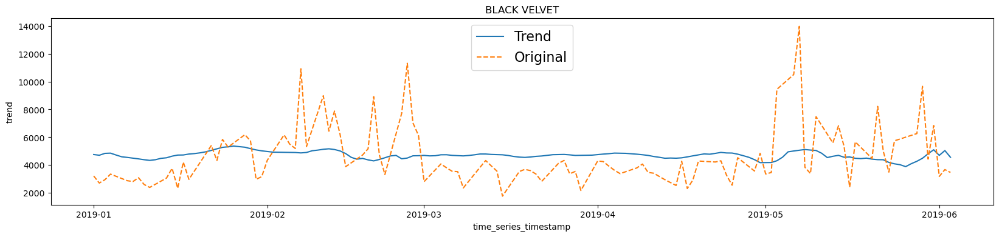

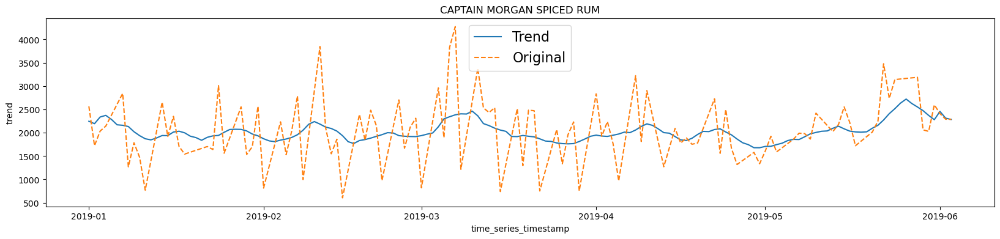

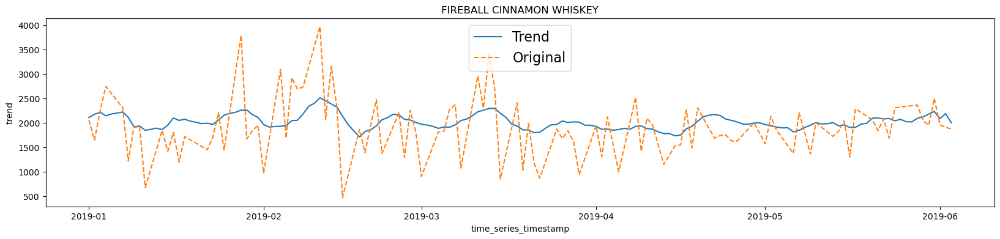

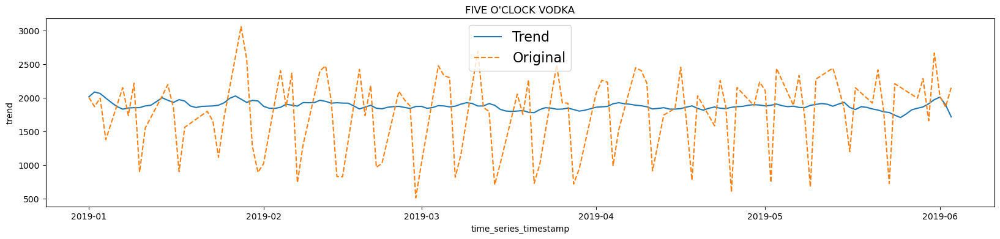

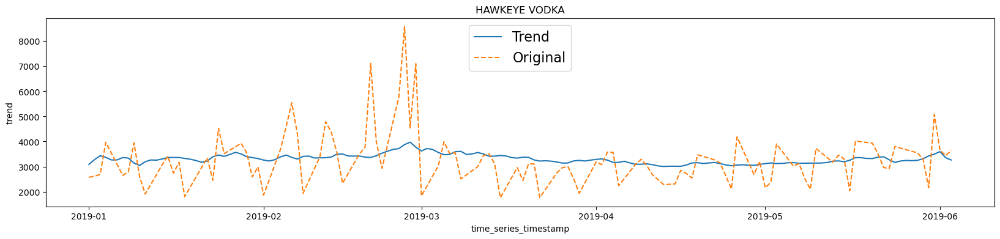

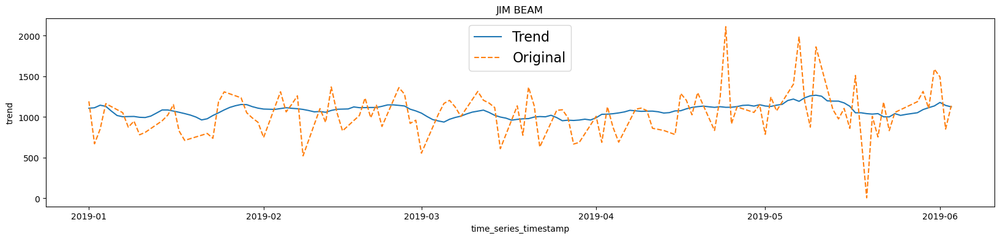

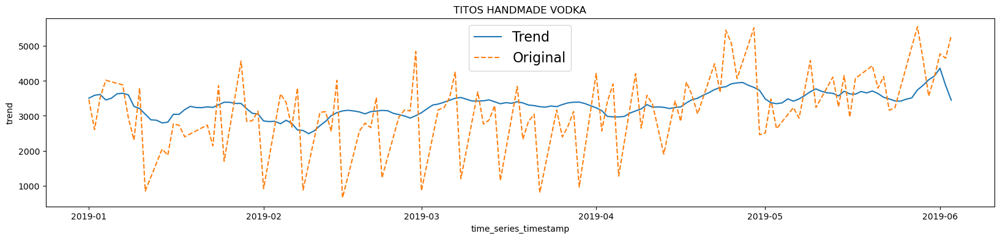

In [117]:

itemslist_trend = list(dfforcast_result.item_name.unique())

for item in itemslist_trend:
    datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
    plt.figure(figsize=(20,4))
    plt.plot(datat["time_series_timestamp"], datat["trend"], label = 'Trend')
    plt.plot(datat["time_series_timestamp"], datat["time_series_data"], alpha = 1, label = 'Original', linestyle='--')
    plt.xlabel("time_series_timestamp")
    plt.ylabel("trend")
    plt.title(item)
    plt.legend(loc = 'upper center', prop={'size': 16})

compare trends with bigger smoothing window size. 

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will

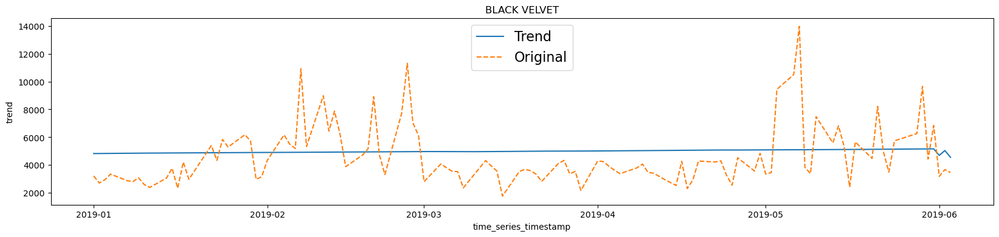

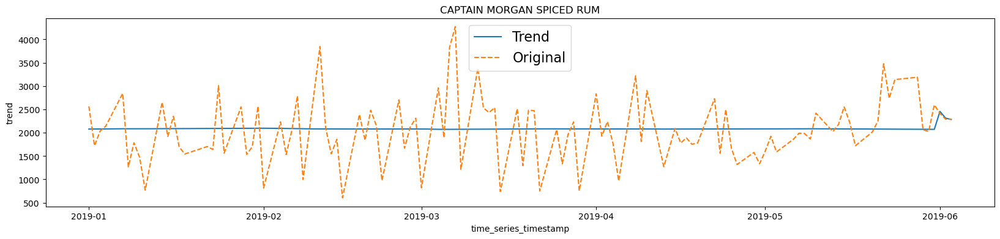

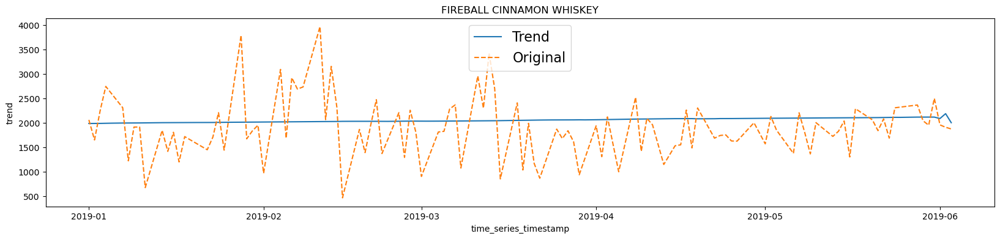

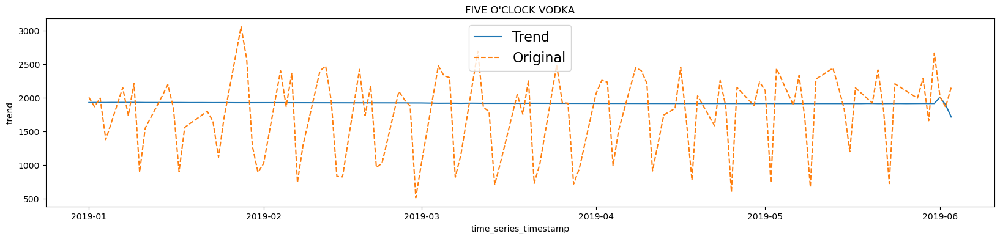

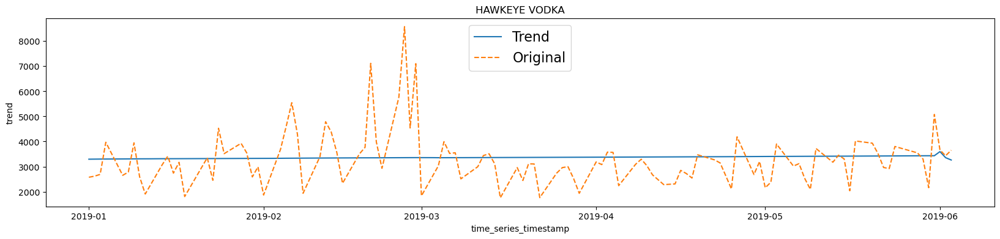

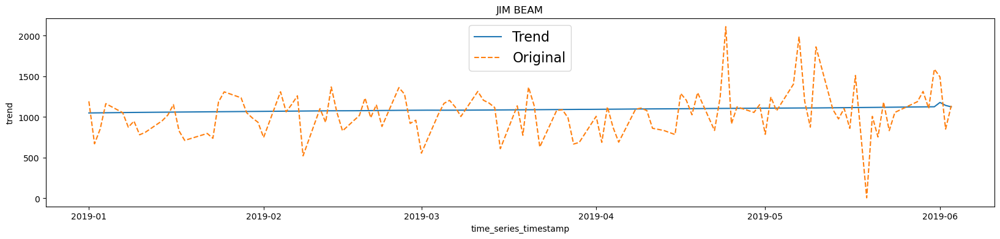

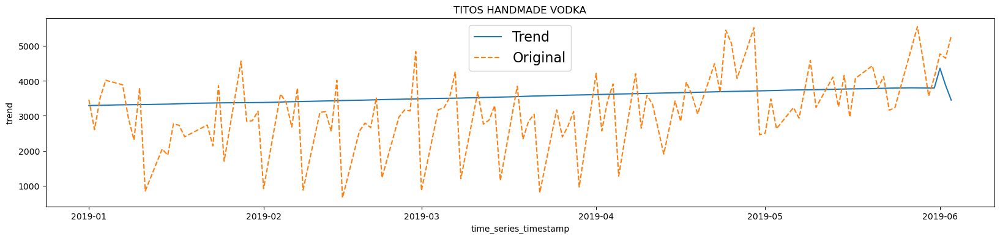

In [263]:
itemslist_trend = list(dfforcast_result.item_name.unique())

for item in itemslist_trend:
    datat = dfforcast_result_tr[dfforcast_result_tr.item_name==item][dfforcast_result_tr["time_series_timestamp"] >= '2019-01-01']
    plt.figure(figsize=(20,4))
    plt.plot(datat["time_series_timestamp"], datat["trend"], label = 'Trend')
    plt.plot(datat["time_series_timestamp"], datat["time_series_data"], alpha = 1, label = 'Original', linestyle='--')
    plt.xlabel("time_series_timestamp")
    plt.ylabel("trend")
    plt.title(item)
    plt.legend(loc = 'upper center', prop={'size': 16})

### Seasonality

Get seasonality(cycle) component from `dfforcast_result` dataframe. There are some time series with multiple seasonalities, and they are all added. 

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

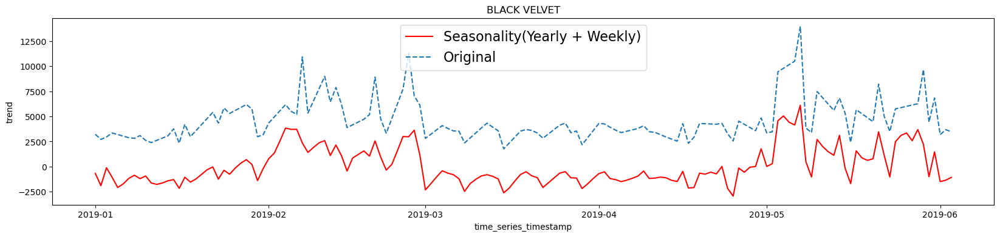

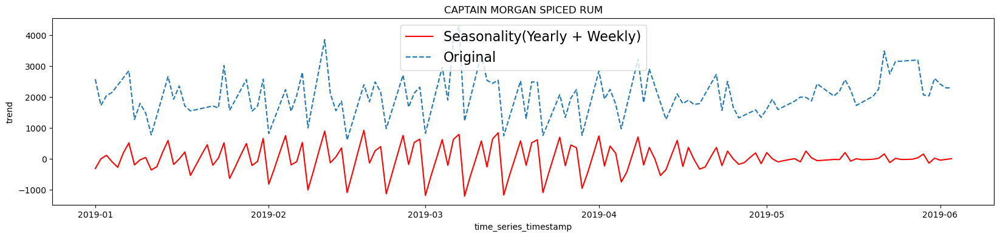

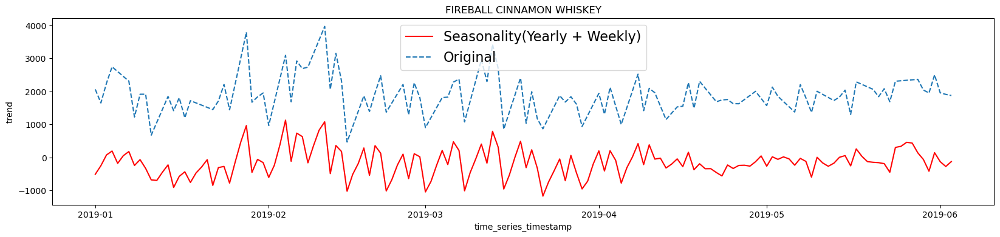

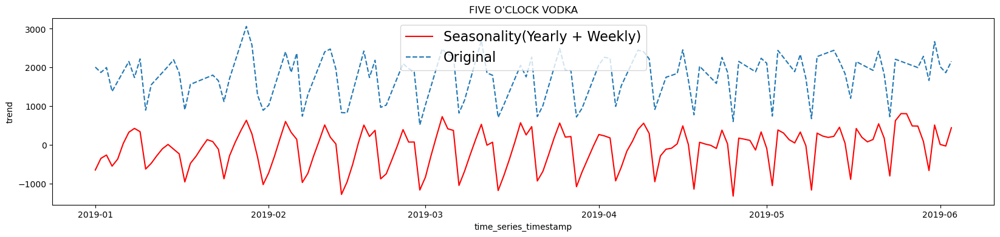

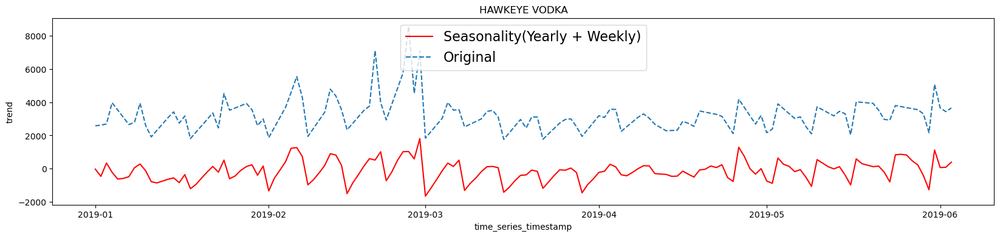

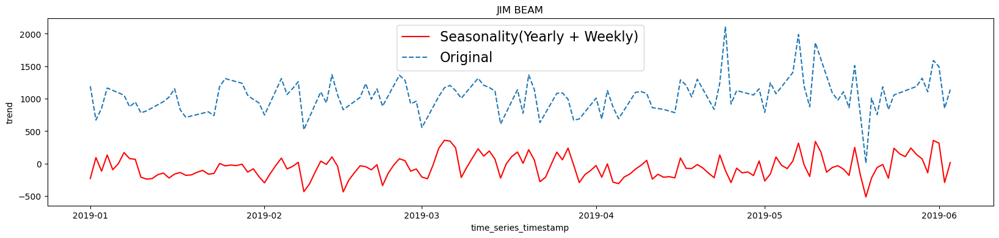

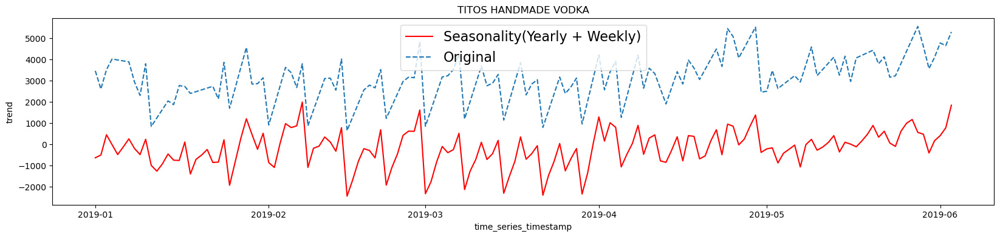

In [134]:
import numpy as np

itemslist_trend = list(dfforcast_result.item_name.unique())

for item in itemslist_trend:
    datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
    plt.figure(figsize=(20,4))
    plt.plot(datat["time_series_timestamp"], datat["seasonal_period_yearly"].replace(np.nan, 0)+datat["seasonal_period_weekly"], label = 'Seasonality(Yearly + Weekly)', color= 'red')
    plt.plot(datat["time_series_timestamp"], datat["time_series_data"], alpha = 1, label = 'Original', linestyle='--')
    plt.xlabel("time_series_timestamp")
    plt.ylabel("trend")
    plt.title(item)
    plt.legend(loc = 'upper center', prop={'size': 16})

### Holiday effect

Get holiday effect components from `dfforcast_result` dataframe. This data is from Iowa, and holiday option is set as `'US'`

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will

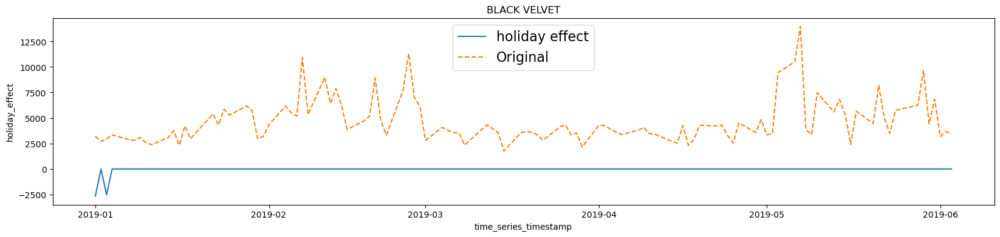

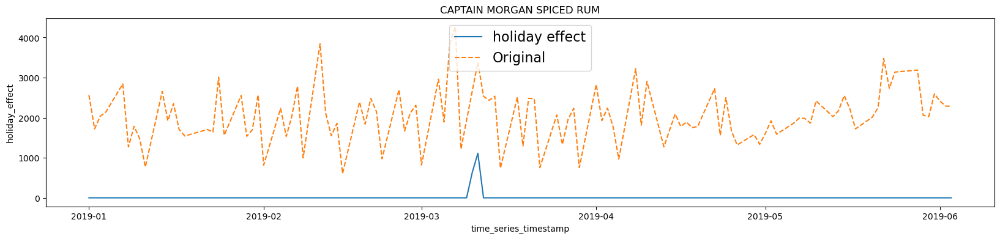

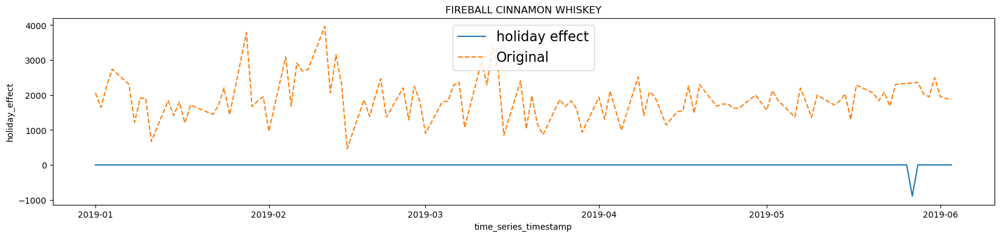

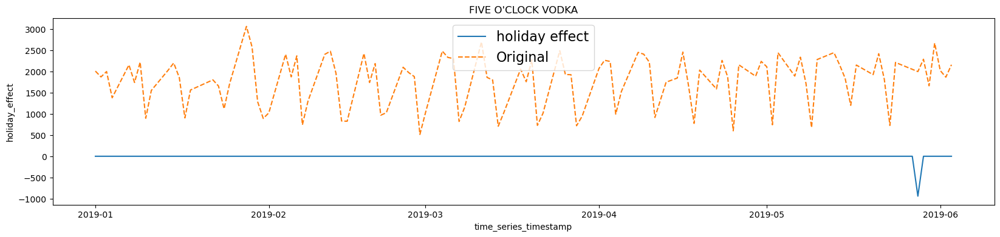

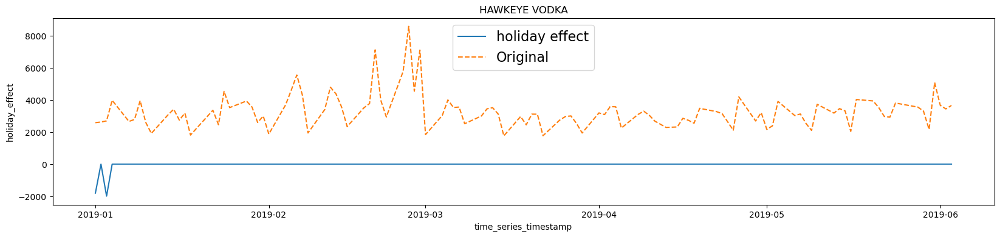

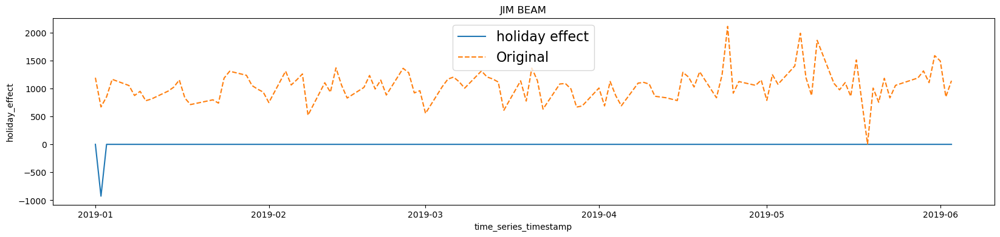

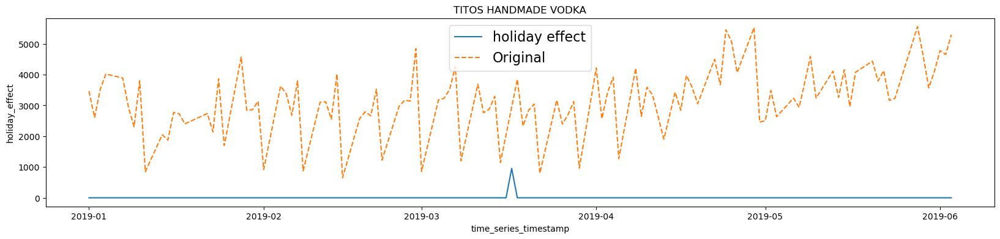

In [178]:
itemslist_trend = list(dfforcast_result.item_name.unique())

for item in itemslist_trend:
    datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
    plt.figure(figsize=(20,4))
    plt.plot(datat["time_series_timestamp"], datat["holiday_effect"], label = "holiday effect")
    plt.plot(datat["time_series_timestamp"], datat["time_series_data"], alpha = 1, label = 'Original', linestyle='--')
    plt.xlabel("time_series_timestamp")
    plt.ylabel("holiday_effect")
    plt.title(item)
    plt.legend(loc = 'upper center', prop={'size': 16})


In [166]:
%%bigquery --project $PROJECT_ID 

## save explain_forecast result to bigquery table

CREATE OR REPLACE TABLE bqmlforecast.first_trained AS (
SELECT  *, COALESCE(seasonal_period_yearly, 0, seasonal_period_yearly) + seasonal_period_weekly as seasonal
FROM 
  ML.EXPLAIN_FORECAST(MODEL bqmlforecast.arima_plus_model)
);

Query is running:   0%|          |

""


In [167]:
%%bigquery --project $PROJECT_ID 

SELECT * 
FROM bqmlforecast.first_trained
LIMIT 10;

Query is running:   0%|          |

Downloading:   0%|          |

,item_name,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,seasonal_period_yearly,seasonal_period_quarterly,seasonal_period_monthly,seasonal_period_weekly,seasonal_period_daily,holiday_effect,spikes_and_dips,step_changes,seasonal
0,BLACK VELVET,2016-01-31 00:00:00+00:00,history,8571.500,7851.629,641.549,NaN,NaN,NaN,6058.392,1151.802,NaN,NaN,51.287,NaN,0.000,0.000,0.000,1203.089
1,BLACK VELVET,2016-02-17 00:00:00+00:00,history,8607.000,8524.706,641.549,NaN,NaN,NaN,5206.596,1990.789,NaN,NaN,974.762,NaN,0.000,0.000,0.000,2965.552
2,BLACK VELVET,2016-03-21 00:00:00+00:00,history,4238.000,4437.505,641.549,NaN,NaN,NaN,5282.343,-1222.059,NaN,NaN,501.727,NaN,0.000,0.000,0.000,-720.332
3,BLACK VELVET,2016-04-10 00:00:00+00:00,history,4292.250,4467.034,641.549,NaN,NaN,NaN,5315.866,-846.403,NaN,NaN,-19.692,NaN,0.000,0.000,0.000,-866.095
4,BLACK VELVET,2016-05-16 00:00:00+00:00,history,6110.000,6239.004,641.549,NaN,NaN,NaN,5014.316,1017.456,NaN,NaN,-60.757,NaN,0.000,0.000,0.000,956.699
5,BLACK VELVET,2016-10-03 00:00:00+00:00,history,5282.000,5427.882,641.549,NaN,NaN,NaN,4761.768,28.715,NaN,NaN,1068.630,NaN,0.000,0.000,0.000,1097.345
6,BLACK VELVET,2016-10-11 00:00:00+00:00,history,4212.000,3885.753,641.549,NaN,NaN,NaN,4877.723,126.819,NaN,NaN,1.014,NaN,-1556.203,0.000,0.000,127.833
7,BLACK VELVET,2016-10-15 00:00:00+00:00,history,4044.333,3669.861,641.549,NaN,NaN,NaN,4901.624,-512.562,NaN,NaN,-581.597,NaN,0.000,0.000,0.000,-1094.160
8,BLACK VELVET,2016-10-16 00:00:00+00:00,history,5125.667,4682.358,641.549,NaN,NaN,NaN,4918.700,-642.114,NaN,NaN,263.554,NaN,0.000,0.000,0.000,-378.560
9,BLACK VELVET,2016-10-25 00:00:00+00:00,history,5087.000,5163.014,641.549,NaN,NaN,NaN,4277.833,1689.366,NaN,NaN,-201.452,NaN,0.000,0.000,0.000,1487.914


## Forecasting Trend & Seasonality 

Trend and seasonality are quite stable component in time-series data, and they can be forecasted more exact. Trend and seasonality forecasting can be useful to prepare the future with the overall view. It may be not exact value, but more predictable direction.

### Trend forecasting

Apply trend data to ARIMA+ again

In [140]:
%%bigquery --project $PROJECT_ID 

CREATE OR REPLACE MODEL bqmlforecast.arima_trend_model

OPTIONS(
  MODEL_TYPE='ARIMA_PLUS',
  TIME_SERIES_TIMESTAMP_COL='time_series_timestamp', 
  TIME_SERIES_DATA_COL='trend',
  TIME_SERIES_ID_COL='item_name'
) AS

SELECT 
    time_series_timestamp,
    item_name,
    trend
FROM
  bqmlforecast.first_trained

Query is running:   0%|          |

""


In [141]:
%%bigquery --project $PROJECT_ID 

SELECT
  *
FROM
  ML.ARIMA_EVALUATE(MODEL bqmlforecast.arima_trend_model)

Query is running:   0%|          |

Downloading:   0%|          |

,item_name,non_seasonal_p,non_seasonal_d,non_seasonal_q,has_drift,log_likelihood,AIC,variance,seasonal_periods,has_holiday_effect,has_spikes_and_dips,has_step_changes,error_message
0,BLACK VELVET,0,1,5,False,-7157.865,14327.731,5614.889,[WEEKLY],False,False,True,
1,CAPTAIN MORGAN SPICED RUM,1,1,4,True,-6473.121,12960.241,1887.588,[WEEKLY],False,False,False,
2,FIREBALL CINNAMON WHISKEY,0,1,5,False,-6596.984,13205.968,2282.090,[WEEKLY],False,False,True,
3,FIVE O'CLOCK VODKA,0,1,5,False,-6102.612,12217.224,1040.054,[WEEKLY],False,False,True,
4,HAWKEYE VODKA,0,1,5,False,-6572.408,13156.817,2210.311,[WEEKLY],False,False,True,
5,JIM BEAM,3,1,2,False,-5378.589,10769.179,328.490,[NO_SEASONALITY],False,False,True,
6,TITOS HANDMADE VODKA,2,1,3,False,-7106.684,14225.367,5218.316,[NO_SEASONALITY],False,False,True,


In [218]:
%%bigquery dfforecast_trend --project $PROJECT_ID 

DECLARE HORIZON STRING DEFAULT "100"; #number of values to forecast
DECLARE CONFIDENCE_LEVEL STRING DEFAULT "0.90";

EXECUTE IMMEDIATE format("""
    SELECT
      *
    FROM 
      ML.FORECAST(MODEL bqmlforecast.arima_trend_model, 
                  STRUCT(%s AS horizon, 
                         %s AS confidence_level)
                 )
    """,HORIZON,CONFIDENCE_LEVEL)

Query is running:   0%|          |

Downloading:   0%|          |

In [174]:
dfforecast_trend.head()

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
0,BLACK VELVET,2019-06-04 00:00:00+00:00,4637.812,75.043,0.900,4514.510,4761.113,4514.510,4761.113
1,BLACK VELVET,2019-06-05 00:00:00+00:00,4717.207,118.090,0.900,4523.176,4911.237,4523.176,4911.237
2,BLACK VELVET,2019-06-06 00:00:00+00:00,4310.194,183.946,0.900,4007.958,4612.430,4007.958,4612.430
3,BLACK VELVET,2019-06-07 00:00:00+00:00,4501.254,256.880,0.900,4079.182,4923.326,4079.182,4923.326
4,BLACK VELVET,2019-06-08 00:00:00+00:00,4209.225,328.726,0.900,3669.105,4749.345,3669.105,4749.345


In [171]:
%%bigquery --project $PROJECT_ID 

CREATE OR REPLACE MODEL bqmlforecast.arima_seasons_model

OPTIONS(
  MODEL_TYPE='ARIMA_PLUS',
  TIME_SERIES_TIMESTAMP_COL='time_series_timestamp', 
  TIME_SERIES_DATA_COL='seasonal',
  TIME_SERIES_ID_COL='item_name'
) AS

SELECT 
    time_series_timestamp,
    item_name,
    seasonal
FROM
  bqmlforecast.first_trained

Query is running:   0%|          |

""


### Seasonality forecasting

Apply seasonality data to ARIMA+ again

In [217]:
%%bigquery dfforecast_seasons --project $PROJECT_ID 

DECLARE HORIZON STRING DEFAULT "100"; #number of values to forecast
DECLARE CONFIDENCE_LEVEL STRING DEFAULT "0.90";

EXECUTE IMMEDIATE format("""
    SELECT
      *
    FROM 
      ML.FORECAST(MODEL bqmlforecast.arima_seasons_model, 
                  STRUCT(%s AS horizon, 
                         %s AS confidence_level)
                 )
    """,HORIZON,CONFIDENCE_LEVEL)

Query is running:   0%|          |

Downloading:   0%|          |

In [175]:
dfforecast_seasons.head()

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
0,BLACK VELVET,2019-06-04 00:00:00+00:00,1448.278,126.396,0.900,1240.600,1655.955,1240.600,1655.955
1,BLACK VELVET,2019-06-05 00:00:00+00:00,-1185.784,130.683,0.900,-1400.506,-971.063,-1400.506,-971.063
2,BLACK VELVET,2019-06-06 00:00:00+00:00,-3539.132,130.775,0.900,-3754.005,-3324.260,-3754.005,-3324.260
3,BLACK VELVET,2019-06-07 00:00:00+00:00,-138.052,130.777,0.900,-352.928,76.823,-352.928,76.823
4,BLACK VELVET,2019-06-08 00:00:00+00:00,-806.532,130.936,0.900,-1021.669,-591.395,-1021.669,-591.395


In [176]:
%%bigquery --params $ARIMA_PARAMS  --project $PROJECT_ID 

# prepare data for time series decomposition with longer period
CREATE OR REPLACE TABLE bqmlforecast.training_data2 AS (
    WITH topsellingitems AS(
         SELECT 
            item_description,
            count(item_description) cnt_transactions
        FROM
            `bigquery-public-data.iowa_liquor_sales.sales` 
        GROUP BY 
            item_description
        ORDER BY cnt_transactions DESC
        LIMIT 7 #Top N
    )
    SELECT 
        date,
        item_description AS item_name,
        SUM(bottles_sold) AS total_amount_sold
    FROM
        `bigquery-public-data.iowa_liquor_sales.sales` 
    GROUP BY
        date, item_name
    HAVING 
        date BETWEEN @TRAININGDATA_STARTDATE AND "2020-12-31"
        AND item_description IN (SELECT item_description FROM topsellingitems)
    );


Query is running:   0%|          |

""


In [177]:
%%bigquery --project $PROJECT_ID 

## time series decomposition
CREATE OR REPLACE MODEL bqmlforecast.arima_dec_model

OPTIONS(
  MODEL_TYPE='ARIMA_PLUS',
  TIME_SERIES_TIMESTAMP_COL='date', 
  TIME_SERIES_DATA_COL='total_amount_sold',
  TIME_SERIES_ID_COL='item_name',
  HOLIDAY_REGION='US', 
  DECOMPOSE_TIME_SERIES = TRUE,
  CLEAN_SPIKES_AND_DIPS = TRUE, 
  TREND_SMOOTHING_WINDOW_SIZE = 7
) AS

SELECT 
    date,
    item_name,
    total_amount_sold
FROM
  bqmlforecast.training_data2

Query is running:   0%|          |

""


In [180]:
%%bigquery --project $PROJECT_ID 

CREATE OR REPLACE TABLE bqmlforecast.whole_trained AS (
SELECT  *, COALESCE(seasonal_period_yearly, 0, seasonal_period_yearly) + seasonal_period_weekly as seasonal
FROM 
  ML.EXPLAIN_FORECAST(MODEL bqmlforecast.arima_dec_model)
);

Query is running:   0%|          |

""


In [181]:
%%bigquery --project $PROJECT_ID 

select * 
FROM bqmlforecast.whole_trained
limit 10;

Query is running:   0%|          |

Downloading:   0%|          |

,item_name,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,seasonal_period_yearly,seasonal_period_quarterly,seasonal_period_monthly,seasonal_period_weekly,seasonal_period_daily,holiday_effect,spikes_and_dips,step_changes,seasonal
0,BLACK VELVET,2016-02-15 00:00:00+00:00,history,6050.000,6847.075,710.131,NaN,NaN,NaN,5358.520,1364.070,NaN,NaN,182.148,NaN,0.000,0.000,NaN,1546.218
1,BLACK VELVET,2016-03-22 00:00:00+00:00,history,5129.000,4774.455,710.131,NaN,NaN,NaN,5263.407,-1125.751,NaN,NaN,1022.509,NaN,0.000,0.000,NaN,-103.242
2,BLACK VELVET,2016-03-27 00:00:00+00:00,history,4258.250,4342.817,710.131,NaN,NaN,NaN,5431.529,-1246.088,NaN,NaN,87.603,NaN,0.000,0.000,NaN,-1158.485
3,BLACK VELVET,2016-05-13 00:00:00+00:00,history,4997.750,4720.107,710.131,NaN,NaN,NaN,5638.146,951.278,NaN,NaN,-1176.102,NaN,0.000,0.000,NaN,-224.824
4,BLACK VELVET,2016-10-18 00:00:00+00:00,history,5678.000,5660.636,710.131,NaN,NaN,NaN,4785.580,610.286,NaN,NaN,-180.284,NaN,0.000,0.000,NaN,430.002
5,BLACK VELVET,2016-11-03 00:00:00+00:00,history,3595.000,4240.655,710.131,NaN,NaN,NaN,4987.227,-1551.058,NaN,NaN,529.646,NaN,0.000,0.000,NaN,-1021.412
6,BLACK VELVET,2017-07-01 00:00:00+00:00,history,3749.333,4359.075,710.131,NaN,NaN,NaN,4282.792,41.305,NaN,NaN,-432.943,NaN,0.000,0.000,NaN,-391.638
7,BLACK VELVET,2018-02-17 00:00:00+00:00,history,4162.667,4348.600,710.131,NaN,NaN,NaN,4181.336,1114.375,NaN,NaN,-1124.983,NaN,0.000,0.000,NaN,-10.608
8,BLACK VELVET,2018-04-02 00:00:00+00:00,history,3569.000,3649.535,710.131,NaN,NaN,NaN,4542.151,-1191.423,NaN,NaN,223.585,NaN,0.000,0.000,NaN,-967.838
9,BLACK VELVET,2018-08-04 00:00:00+00:00,history,2748.333,3082.203,710.131,NaN,NaN,NaN,4872.847,-1242.571,NaN,NaN,-893.339,NaN,0.000,0.000,NaN,-2135.909


### Plot trend forecasting

Plot trend forecasting result and compare with original trend data

%%bigquery dfactual_trend --params $ARIMA_PARAMS --project $PROJECT_ID 

DECLARE HORIZON STRING DEFAULT "100"; #number of values to forecast
    
SELECT 
    time_series_timestamp as date,
    item_name,
    trend as total_amount_sold
FROM
    bqmlforecast.whole_trained
WHERE
     CAST(time_series_timestamp AS DATE) BETWEEN DATE_ADD(@TRAININGDATA_ENDDATE, 
                              INTERVAL 1 DAY) 
            AND DATE_ADD(@TRAININGDATA_ENDDATE, 
                             INTERVAL 1+CAST(HORIZON AS INT64) DAY) 
ORDER BY
     time_series_timestamp;

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will

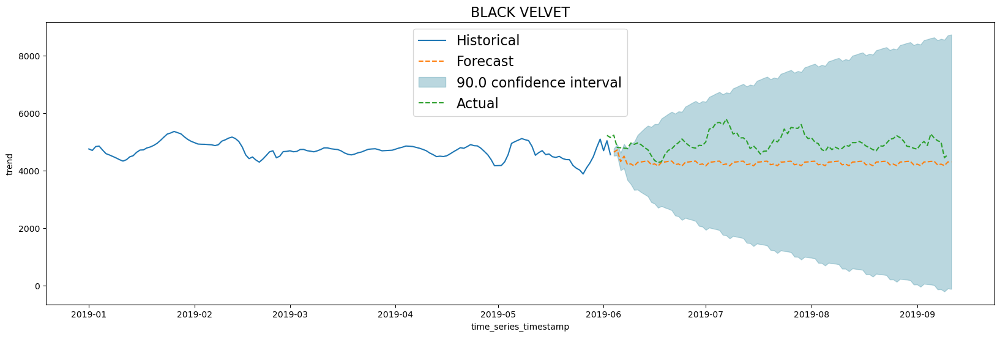

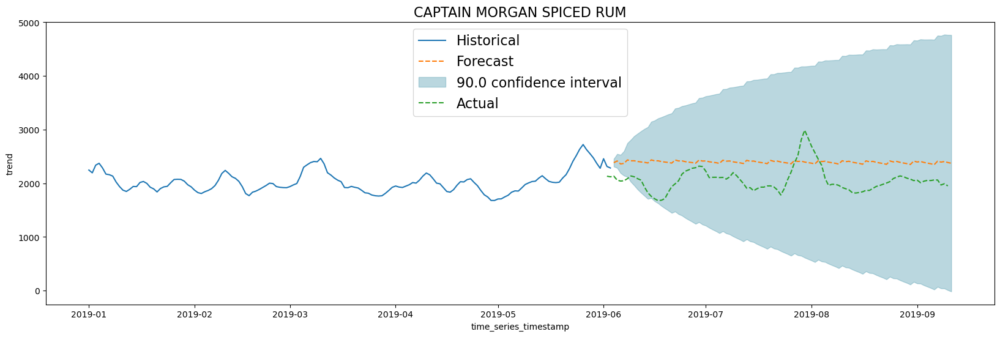

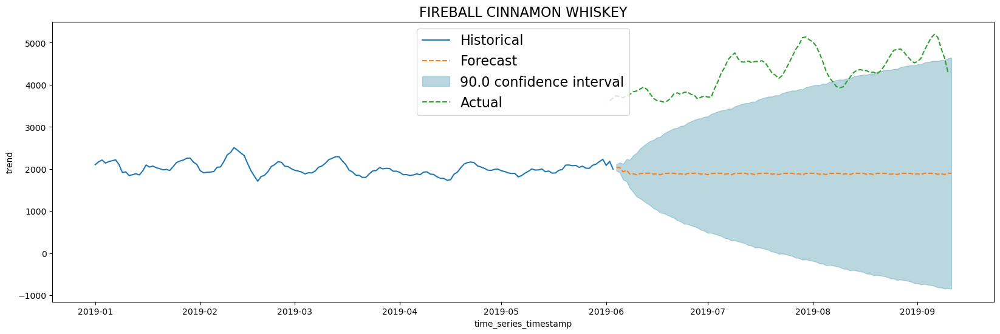

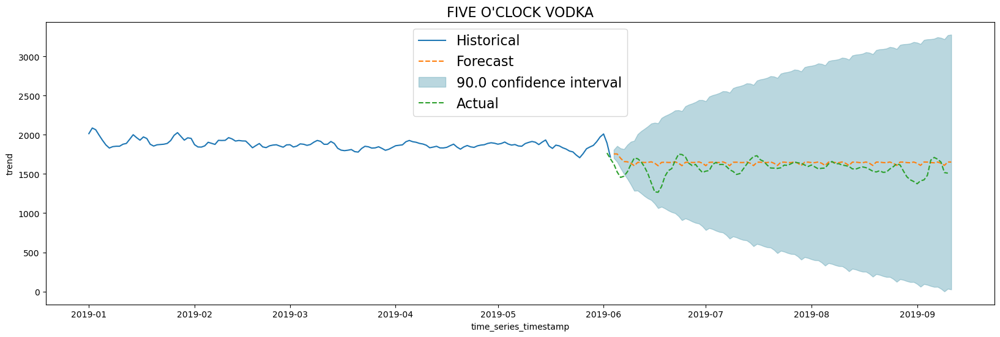

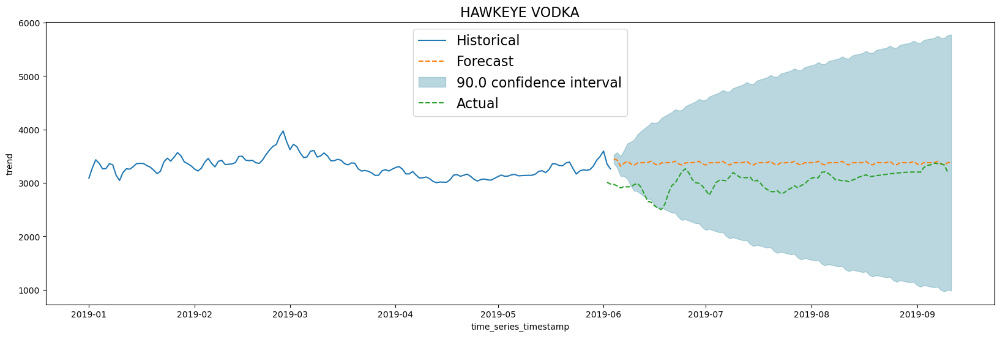

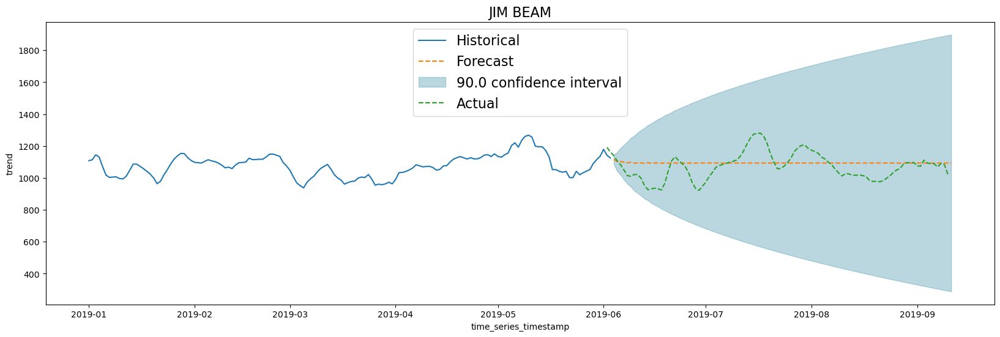

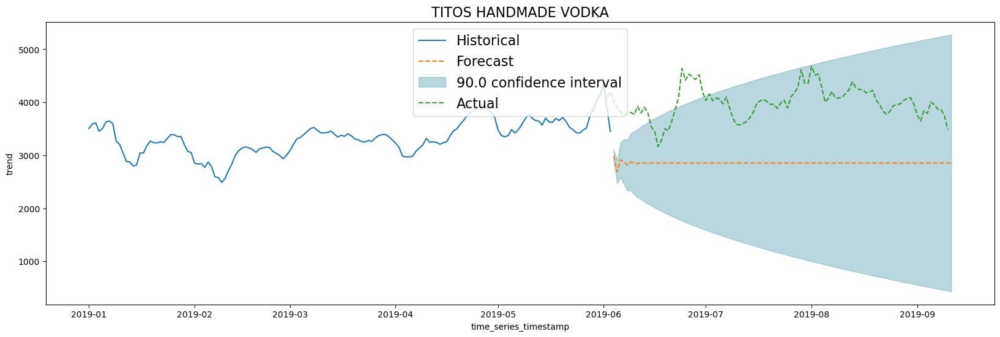

In [226]:
itemslist = list(dfforcast_result.item_name.unique())

for item in itemslist:
    datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
    dataf = dfforecast_trend[dfforecast_trend.item_name==item].sort_values(['forecast_timestamp'])
    dataa = dfactual_trend[dfactual_trend.item_name==item].sort_values('date')
    plot_historical_and_forecast(input_timeseries = datah, 
                             timestamp_col_name = "time_series_timestamp", 
                             data_col_name = "trend", 
                             forecast_output = dataf, 
                             actual = dataa,
                             title = item,
                             plotstartdate = "2018-06-01 00:00:00+00:00")

### Plot seasonality forecasting

Plot seasonality forecasting result and compare with original seasonality data

In [194]:
dfforcast_result['seasonal'] = dfforcast_result["seasonal_period_yearly"].replace(np.nan, 0)+dfforcast_result["seasonal_period_weekly"]

dfforcast_result.head()

,item_name,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,seasonal_period_yearly,seasonal_period_quarterly,seasonal_period_monthly,seasonal_period_weekly,seasonal_period_daily,holiday_effect,spikes_and_dips,step_changes,seasonal
0,BLACK VELVET,2016-01-04 00:00:00+00:00,history,5014.000,5014.000,641.549,NaN,NaN,NaN,2419.791,-1485.809,NaN,NaN,669.190,NaN,0.000,0.000,0.000,-816.620
1,BLACK VELVET,2016-01-05 00:00:00+00:00,history,5193.000,5302.728,641.549,NaN,NaN,NaN,3216.001,-1496.538,NaN,NaN,968.649,NaN,0.000,0.000,0.000,-527.889
2,BLACK VELVET,2016-01-06 00:00:00+00:00,history,4422.000,4994.449,641.549,NaN,NaN,NaN,4021.818,-1133.605,NaN,NaN,376.234,NaN,0.000,0.000,0.000,-757.371
3,BLACK VELVET,2016-01-07 00:00:00+00:00,history,3760.000,3507.665,641.549,NaN,NaN,NaN,4790.467,-860.879,NaN,NaN,-987.555,NaN,0.000,0.000,0.000,-1848.435
4,BLACK VELVET,2016-01-08 00:00:00+00:00,history,3943.000,3948.102,641.549,NaN,NaN,NaN,5578.526,-712.678,NaN,NaN,-912.692,NaN,0.000,0.000,0.000,-1625.371


In [196]:
dfforecast_seasons['seasonal'] = dfforecast_seasons['forecast_value']

dfforecast_seasons.head()

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound,seasonal
0,BLACK VELVET,2019-06-04 00:00:00+00:00,1448.278,126.396,0.900,1240.600,1655.955,1240.600,1655.955,1448.278
1,BLACK VELVET,2019-06-05 00:00:00+00:00,-1185.784,130.683,0.900,-1400.506,-971.063,-1400.506,-971.063,-1185.784
2,BLACK VELVET,2019-06-06 00:00:00+00:00,-3539.132,130.775,0.900,-3754.005,-3324.260,-3754.005,-3324.260,-3539.132
3,BLACK VELVET,2019-06-07 00:00:00+00:00,-138.052,130.777,0.900,-352.928,76.823,-352.928,76.823,-138.052
4,BLACK VELVET,2019-06-08 00:00:00+00:00,-806.532,130.936,0.900,-1021.669,-591.395,-1021.669,-591.395,-806.532


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will

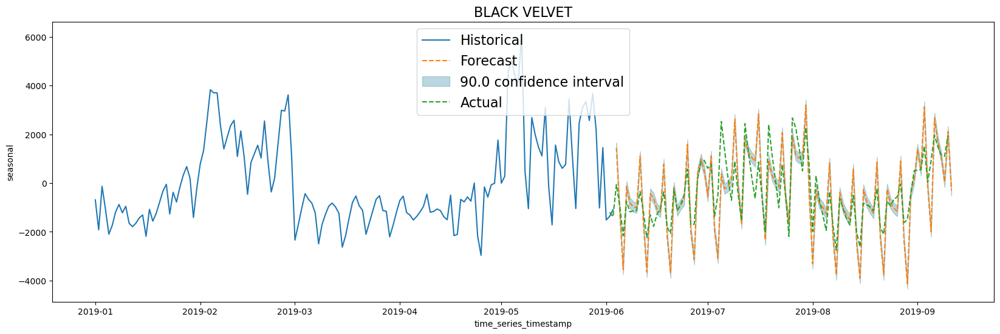

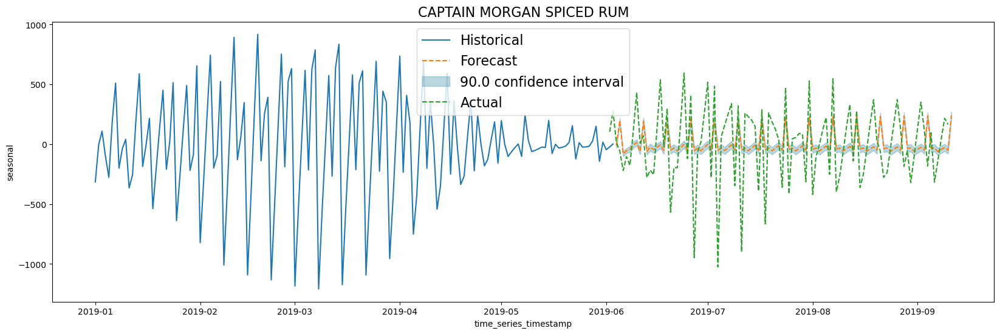

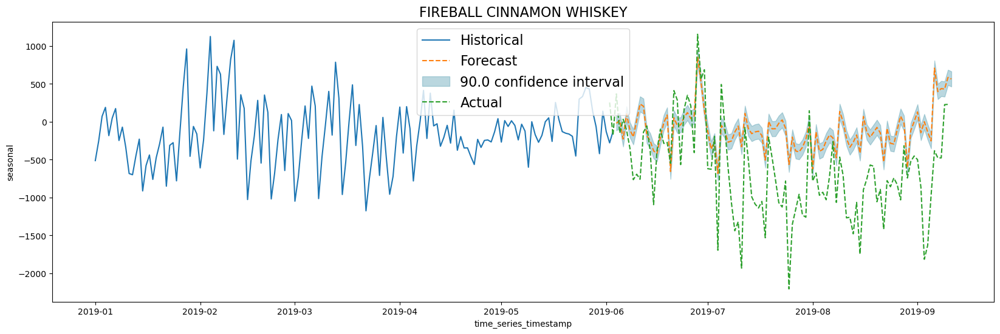

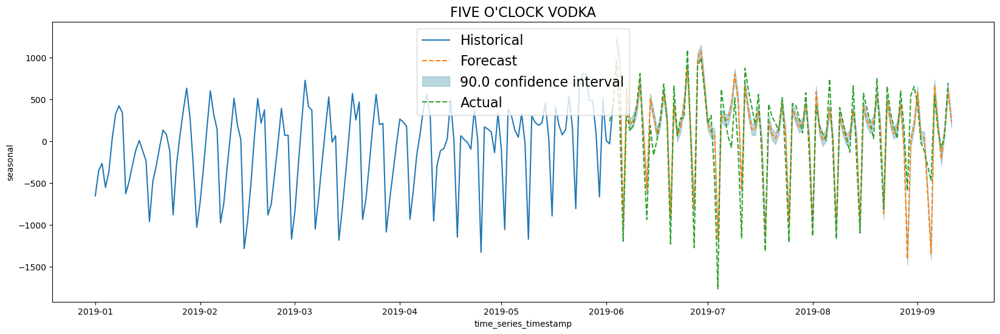

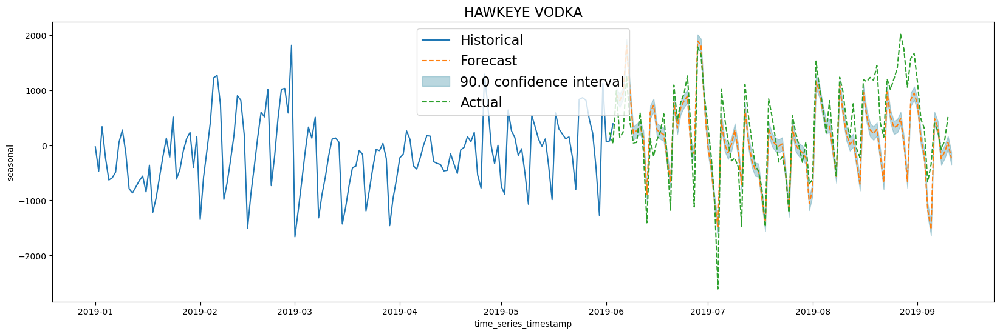

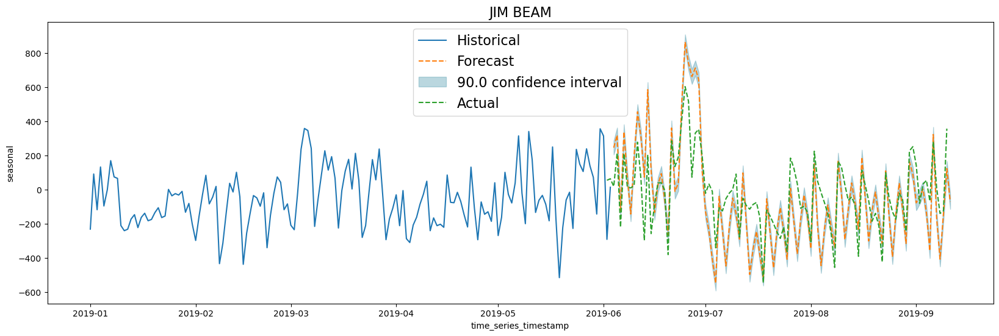

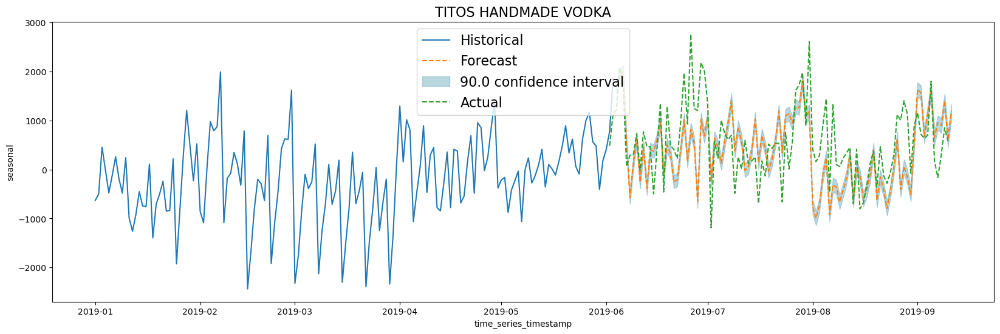

In [227]:
itemslist = list(dfforcast_result.item_name.unique())

for item in itemslist:
    datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
    dataf = dfforecast_seasons[dfforecast_seasons.item_name==item].sort_values(['forecast_timestamp'])
    dataa = dfactual_seasons[dfactual_seasons.item_name==item].sort_values('date')
    plot_historical_and_forecast(input_timeseries = datah, 
                             timestamp_col_name = "time_series_timestamp", 
                             data_col_name = "seasonal", 
                             forecast_output = dataf, 
                             actual = dataa,
                             title = item,
                             plotstartdate = "2018-06-01 00:00:00+00:00")

# Plot trend + seasonality forecasting

Plot  trend + seasonality forecasting result and compare with original trend + seasonality data. It can be more predictable when the data has strong trend or seasonality, and understand data without noise. 

In [228]:
itemslist = list(dfhistorical.item_name.unique())
dfforecast_seasons = dfforecast_seasons.set_index(['item_name','forecast_timestamp'])
dfforecast_trend = dfforecast_trend.set_index(['item_name','forecast_timestamp'])
new_for = dfforecast_seasons + dfforecast_trend

new_for.head()

forecast_value  standard_error  \
item_name    forecast_timestamp                                          
BLACK VELVET 2019-06-04 00:00:00+00:00        6086.089         201.439   
             2019-06-05 00:00:00+00:00        3531.422         248.773   
             2019-06-06 00:00:00+00:00         771.062         314.721   
             2019-06-07 00:00:00+00:00        4363.201         387.657   
             2019-06-08 00:00:00+00:00        3402.693         459.662   

                                        confidence_level  \
item_name    forecast_timestamp                            
BLACK VELVET 2019-06-04 00:00:00+00:00             1.800   
             2019-06-05 00:00:00+00:00             1.800   
             2019-06-06 00:00:00+00:00             1.800   
             2019-06-07 00:00:00+00:00             1.800   
             2019-06-08 00:00:00+00:00             1.800   

                                        prediction_interval_lower_bound  \
item_name    forecast_timestamp                                           
BLACK VELVET 2019-06-04 00:00:00+00:00                         5755.110   
             2019-06-05 00:00:00+00:00                         3122.670   
             2019-06-06 00:00:00+00:00                          253.954   
             2019-06-07 00:00:00+00:00                         3726.254   
             2019-06-08 00:00:00+00:00                         2647.436   

                                        prediction_interval_upper_bound  \
item_name    forecast_timestamp                                           
BLACK VELVET 2019-06-04 00:00:00+00:00                         6417.068   
             2019-06-05 00:00:00+00:00                         3940.174   
             2019-06-06 00:00:00+00:00                         1288.170   
             2019-06-07 00:00:00+00:00                         5000.149   
             2019-06-08 00:00:00+00:00                         4157.950   

                                        confidence_interval_lower_bound  \
item_name    forecast_timestamp                                           
BLACK VELVET 2019-06-04 00:00:00+00:00                         5755.110   
             2019-06-05 00:00:00+00:00                         3122.670   
             2019-06-06 00:00:00+00:00                          253.954   
             2019-06-07 00:00:00+00:00                         3726.254   
             2019-06-08 00:00:00+00:00                         2647.436   

                                        confidence_interval_upper_bound  
item_name    forecast_timestamp                                          
BLACK VELVET 2019-06-04 00:00:00+00:00                         6417.068  
             2019-06-05 00:00:00+00:00                         3940.174  
             2019-06-06 00:00:00+00:00                         1288.170  
             2019-06-07 00:00:00+00:00                         5000.149  
             2019-06-08 00:00:00+00:00                         4157.950

In [229]:
new_for= new_for.reset_index()

In [306]:
%%bigquery dfactual_full --params $ARIMA_PARAMS --project $PROJECT_ID 

DECLARE HORIZON STRING DEFAULT "100"; #number of values to forecast
    
SELECT 
    time_series_timestamp as date,
    item_name,
    trend+seasonal as total_amount_sold
FROM
    bqmlforecast.whole_trained
WHERE
     CAST(time_series_timestamp AS DATE) BETWEEN '2019-01-01'
            AND DATE_ADD(@TRAININGDATA_ENDDATE, 
                             INTERVAL 1+CAST(HORIZON AS INT64) DAY) 
ORDER BY
     time_series_timestamp;

Query is running:   0%|          |

Downloading:   0%|          |

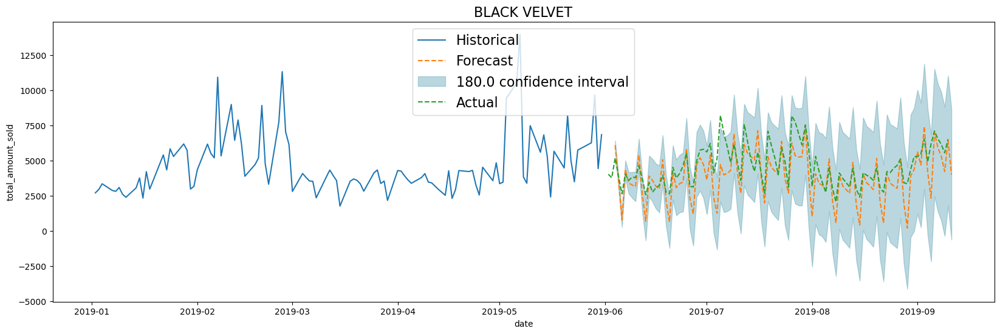

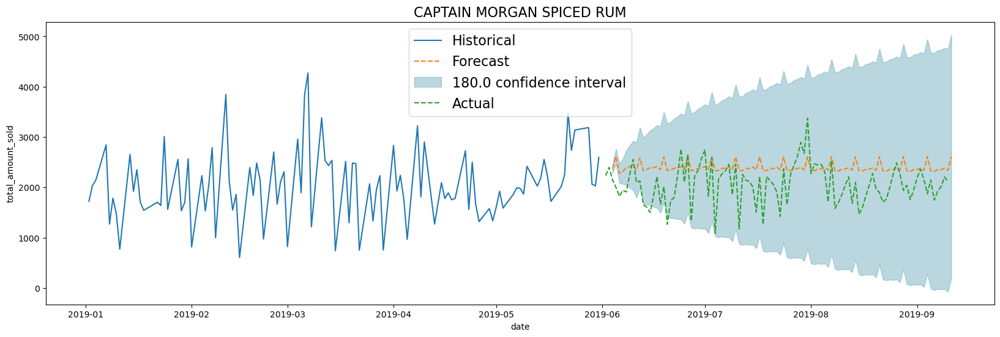

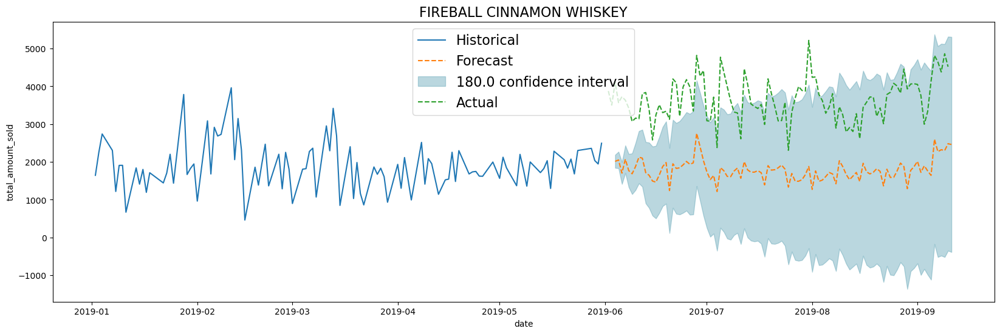

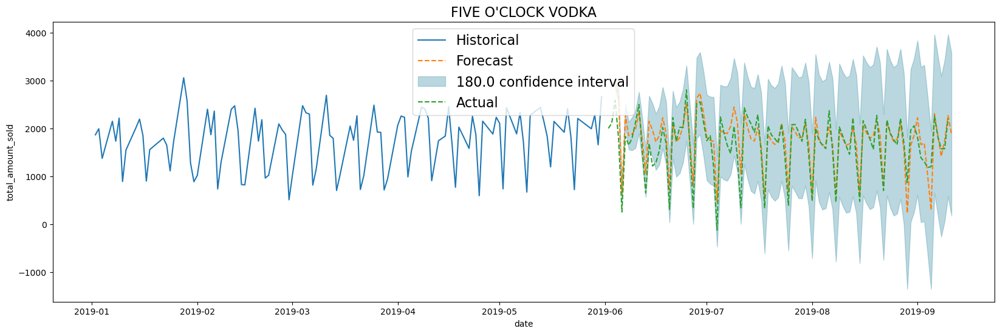

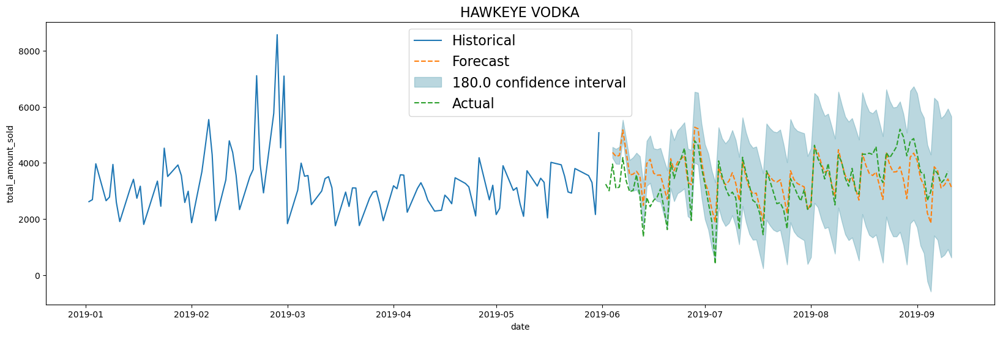

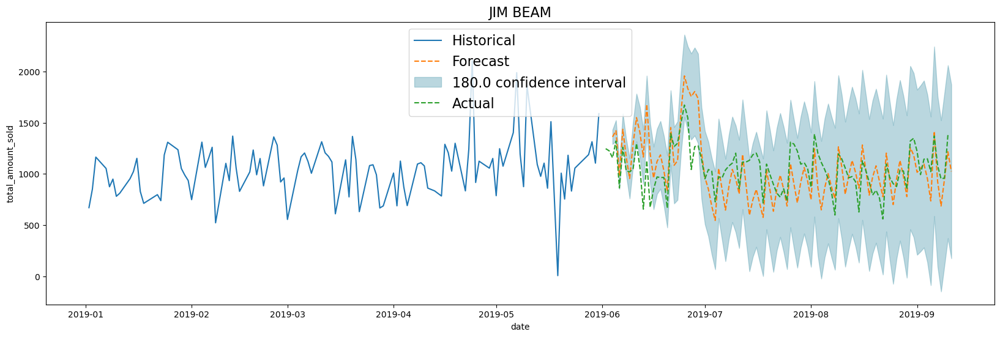

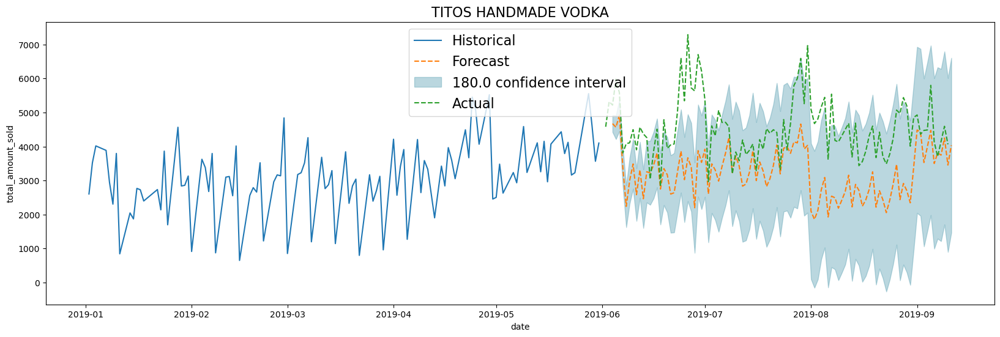

In [232]:
itemslist = list(dfforcast_result.item_name.unique())

for item in itemslist:
    datah = dfhistorical[dfhistorical.item_name==item].sort_values('date')
    dataf = new_for[new_for.item_name==item].sort_values(['forecast_timestamp'])
    dataa = dfactual_full[dfactual_full.item_name==item].sort_values('date')
    plot_historical_and_forecast(input_timeseries = datah, 
                             timestamp_col_name = "date", 
                             data_col_name = "total_amount_sold", 
                             forecast_output = dataf, 
                             actual = dataa,
                             title = item,
                             plotstartdate = "2019-01-01")

## Compare original model and trend+seasonality model
Compare original model and trend+seasonality model with simple stats about `absolute value of (prediction value-actual values)`

In [256]:
new_for = new_for.reset_index()
new_for['total_amount_sold'] = new_for['forecast_value']
new_for['date']=new_for['forecast_timestamp']
new_for = new_for.set_index(['item_name','date'])
dfactual_full = dfactual_full.reset_index()
dfactual_full = dfactual_full.set_index(['item_name','date'])
stat_ts = np.absolute(dfactual_full - new_for)
stat_ts.head()

confidence_interval_lower_bound  \
item_name    date                                                         
BLACK VELVET 2019-06-02 00:00:00+00:00                              NaN   
             2019-06-03 00:00:00+00:00                              NaN   
             2019-06-04 00:00:00+00:00                              NaN   
             2019-06-05 00:00:00+00:00                              NaN   
             2019-06-06 00:00:00+00:00                              NaN   

                                        confidence_interval_upper_bound  \
item_name    date                                                         
BLACK VELVET 2019-06-02 00:00:00+00:00                              NaN   
             2019-06-03 00:00:00+00:00                              NaN   
             2019-06-04 00:00:00+00:00                              NaN   
             2019-06-05 00:00:00+00:00                              NaN   
             2019-06-06 00:00:00+00:00                              NaN   

                                        confidence_level  forecast_timestamp  \
item_name    date                                                              
BLACK VELVET 2019-06-02 00:00:00+00:00               NaN                 NaN   
             2019-06-03 00:00:00+00:00               NaN                 NaN   
             2019-06-04 00:00:00+00:00               NaN                 NaN   
             2019-06-05 00:00:00+00:00               NaN                 NaN   
             2019-06-06 00:00:00+00:00               NaN                 NaN   

                                        forecast_value  \
item_name    date                                        
BLACK VELVET 2019-06-02 00:00:00+00:00             NaN   
             2019-06-03 00:00:00+00:00             NaN   
             2019-06-04 00:00:00+00:00             NaN   
             2019-06-05 00:00:00+00:00             NaN   
             2019-06-06 00:00:00+00:00             NaN   

                                        prediction_interval_lower_bound  \
item_name    date                                                         
BLACK VELVET 2019-06-02 00:00:00+00:00                              NaN   
             2019-06-03 00:00:00+00:00                              NaN   
             2019-06-04 00:00:00+00:00                              NaN   
             2019-06-05 00:00:00+00:00                              NaN   
             2019-06-06 00:00:00+00:00                              NaN   

                                        prediction_interval_upper_bound  \
item_name    date                                                         
BLACK VELVET 2019-06-02 00:00:00+00:00                              NaN   
             2019-06-03 00:00:00+00:00                              NaN   
             2019-06-04 00:00:00+00:00                              NaN   
             2019-06-05 00:00:00+00:00                              NaN   
             2019-06-06 00:00:00+00:00                              NaN   

                                        standard_error  total_amount_sold  
item_name    date                                                          
BLACK VELVET 2019-06-02 00:00:00+00:00             NaN                NaN  
             2019-06-03 00:00:00+00:00             NaN                NaN  
             2019-06-04 00:00:00+00:00             NaN            919.881  
             2019-06-05 00:00:00+00:00             NaN            333.501  
             2019-06-06 00:00:00+00:00             NaN           1862.220

In [254]:
dfforecast_plus = dfforecast_plus.reset_index()
dfforecast_plus['total_amount_sold'] = dfforecast_plus['forecast_value']
dfforecast_plus['date']=dfforecast_plus['forecast_timestamp']
dfforecast_plus = dfforecast_plus.set_index(['item_name','date'])
dfactual= dfactual.reset_index()
dfactual = dfactual.set_index(['item_name','date'])
stat_arima = np.absolute(dfactual - dfforecast_plus)

In [255]:
stat_arima.head()

confidence_interval_lower_bound  \
item_name    date                                                         
BLACK VELVET 2019-06-01 00:00:00+00:00                              NaN   
             2019-06-02 00:00:00+00:00                              NaN   
             2019-06-03 00:00:00+00:00                              NaN   
             2019-06-04 00:00:00+00:00                              NaN   
             2019-06-05 00:00:00+00:00                              NaN   

                                        confidence_interval_upper_bound  \
item_name    date                                                         
BLACK VELVET 2019-06-01 00:00:00+00:00                              NaN   
             2019-06-02 00:00:00+00:00                              NaN   
             2019-06-03 00:00:00+00:00                              NaN   
             2019-06-04 00:00:00+00:00                              NaN   
             2019-06-05 00:00:00+00:00                              NaN   

                                        confidence_level  forecast_timestamp  \
item_name    date                                                              
BLACK VELVET 2019-06-01 00:00:00+00:00               NaN                 NaN   
             2019-06-02 00:00:00+00:00               NaN                 NaN   
             2019-06-03 00:00:00+00:00               NaN                 NaN   
             2019-06-04 00:00:00+00:00               NaN                 NaN   
             2019-06-05 00:00:00+00:00               NaN                 NaN   

                                        forecast_value  index  \
item_name    date                                               
BLACK VELVET 2019-06-01 00:00:00+00:00             NaN    NaN   
             2019-06-02 00:00:00+00:00             NaN  3.000   
             2019-06-03 00:00:00+00:00             NaN  5.000   
             2019-06-04 00:00:00+00:00             NaN 17.000   
             2019-06-05 00:00:00+00:00             NaN 21.000   

                                        prediction_interval_lower_bound  \
item_name    date                                                         
BLACK VELVET 2019-06-01 00:00:00+00:00                              NaN   
             2019-06-02 00:00:00+00:00                              NaN   
             2019-06-03 00:00:00+00:00                              NaN   
             2019-06-04 00:00:00+00:00                              NaN   
             2019-06-05 00:00:00+00:00                              NaN   

                                        prediction_interval_upper_bound  \
item_name    date                                                         
BLACK VELVET 2019-06-01 00:00:00+00:00                              NaN   
             2019-06-02 00:00:00+00:00                              NaN   
             2019-06-03 00:00:00+00:00                              NaN   
             2019-06-04 00:00:00+00:00                              NaN   
             2019-06-05 00:00:00+00:00                              NaN   

                                        standard_error  total_amount_sold  
item_name    date                                                          
BLACK VELVET 2019-06-01 00:00:00+00:00             NaN                NaN  
             2019-06-02 00:00:00+00:00             NaN            355.333  
             2019-06-03 00:00:00+00:00             NaN            306.117  
             2019-06-04 00:00:00+00:00             NaN           1062.832  
             2019-06-05 00:00:00+00:00             NaN            117.297

In [257]:
stat_ts = stat_ts.reset_index()
stat_ts[['item_name', 'total_amount_sold']].groupby('item_name').describe()

total_amount_sold                                    \
                                      count     mean     std     min      25%   
item_name                                                                       
BLACK VELVET                         99.000 1018.885 824.987  23.726  464.754   
CAPTAIN MORGAN SPICED RUM            99.000  399.781 291.471   7.638  157.871   
FIREBALL CINNAMON WHISKEY            99.000 1870.976 480.608 974.459 1498.685   
FIVE O'CLOCK VODKA                   99.000  229.809 196.714  10.378   88.244   
HAWKEYE VODKA                        99.000  479.511 404.982   9.564  167.087   
JIM BEAM                             99.000  190.218 147.365   4.433   73.595   
TITOS HANDMADE VODKA                 99.000 1344.051 847.929  32.285  650.894   

                                                      
                               50%      75%      max  
item_name                                             
BLACK VELVET               815.216 1458.851 3903.343  
CAPTAIN MORGAN SPICED RUM  339.652  595.897 1244.329  
FIREBALL CINNAMON WHISKEY 1860.075 2213.374 3335.970  
FIVE O'CLOCK VODKA         173.673  320.825  908.101  
HAWKEYE VODKA              351.762  708.019 1689.775  
JIM BEAM                   162.995  248.321  712.755  
TITOS HANDMADE VODKA      1342.350 1812.395 3618.561

In [258]:
stat_arima = stat_arima.reset_index()
stat_arima[['item_name', 'total_amount_sold']].groupby('item_name').describe()

total_amount_sold                                    \
                                      count     mean     std     min      25%   
item_name                                                                       
BLACK VELVET                         99.000  799.260 774.705   0.718  241.678   
CAPTAIN MORGAN SPICED RUM            99.000  303.935 233.064   8.899  100.128   
FIREBALL CINNAMON WHISKEY            99.000 1739.504 462.993 922.479 1424.255   
FIVE O'CLOCK VODKA                   99.000  309.708 245.104   5.000  111.360   
HAWKEYE VODKA                        99.000  449.471 391.867   8.351  102.148   
JIM BEAM                             99.000  196.829 149.952   0.754   87.854   
TITOS HANDMADE VODKA                 99.000  804.968 649.575  28.379  376.050   

                                                      
                               50%      75%      max  
item_name                                             
BLACK VELVET               588.338 1176.578 3645.111  
CAPTAIN MORGAN SPICED RUM  255.344  428.865 1021.182  
FIREBALL CINNAMON WHISKEY 1697.629 2047.088 3091.943  
FIVE O'CLOCK VODKA         235.737  449.296 1078.047  
HAWKEYE VODKA              351.050  706.448 1694.320  
JIM BEAM                   163.726  251.811  666.237  
TITOS HANDMADE VODKA       633.424  999.881 2954.294

## CausalImpact

Apply `pyCausalImpact` - Python causal impact (or causal inference) implementation of [Google's model](https://github.com/google/CausalImpact) to time-series data, with trend + sseasonality data as a control data 

In [260]:
!pip install pyCausalImpact

In [300]:
%%bigquery dforiginal --project $PROJECT_ID 

## Sample data: HAWKEYE VODKA - There is a change after '2019-08-01'
SELECT 
    date,
    SUM(bottles_sold) AS total_amount_sold
FROM
    `bigquery-public-data.iowa_liquor_sales.sales` 
WHERE
    date BETWEEN '2019-01-01' AND '2019-10-01'
    AND item_description = "HAWKEYE VODKA"
GROUP BY
    date;



Query is running:   0%|          |

Downloading:   0%|          |

In [272]:
dforiginal.head()

,date,total_amount_sold
0,2019-08-01,3010
1,2019-07-26,3905
2,2019-07-05,5505
3,2019-08-07,3827
4,2019-08-19,7278


In [307]:
## add trend+seasonalities

new_tr = dfactual_full[dfactual_full['item_name']=="HAWKEYE VODKA"][dfactual_full["date"]>='2019-01-01'][dfactual_full["date"]<"2019-10-02"][['date', 'total_amount_sold']]
new_tr['date']=new_tr['date'].dt.date
new_tr['trend_season']=new_tr['total_amount_sold']
new_tr.head()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


,date,total_amount_sold,trend_season
6,2019-01-01,1810.495,1810.495
13,2019-01-02,2372.431,2372.431
14,2019-01-03,2603.033,2603.033
27,2019-01-04,2831.801,2831.801
29,2019-01-05,2339.023,2339.023


In [308]:
dfcomp = dforiginal.merge(new_tr[['date','trend_season']], on = 'date').sort_values('date')
dfcomp.head()

,date,total_amount_sold,trend_season
46,2019-01-02,2620,2372.431
91,2019-01-03,2691,2603.033
104,2019-01-04,3970,2831.801
147,2019-01-07,2654,2325.183
8,2019-01-08,2783,2815.860


In [346]:
dfcomp = dfcomp.reset_index()
dfcomp.head()

,index,date,total_amount_sold,trend_season
0,46,2019-01-02,2620,2372.431
1,91,2019-01-03,2691,2603.033
2,104,2019-01-04,3970,2831.801
3,147,2019-01-07,2654,2325.183
4,8,2019-01-08,2783,2815.860


In [351]:
dfcomp['total_amount_sold'] =dfcomp['total_amount_sold'].astype(int)

In [352]:
from causalimpact import CausalImpact

# trend+seasonality as a control group
pre_period = [0,150]
post_period = [151,177] ## 2019-08-01
impact = CausalImpact(dfcomp[['total_amount_sold','trend_season']], pre_period, post_period)

/opt/conda/lib/python3.7/site-packages/statsmodels/base/optimizer.py:23: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score. The list of unsupported keyword arguments passed include: nseasons, standardize. After release 0.14, this will raise.
  FutureWarning


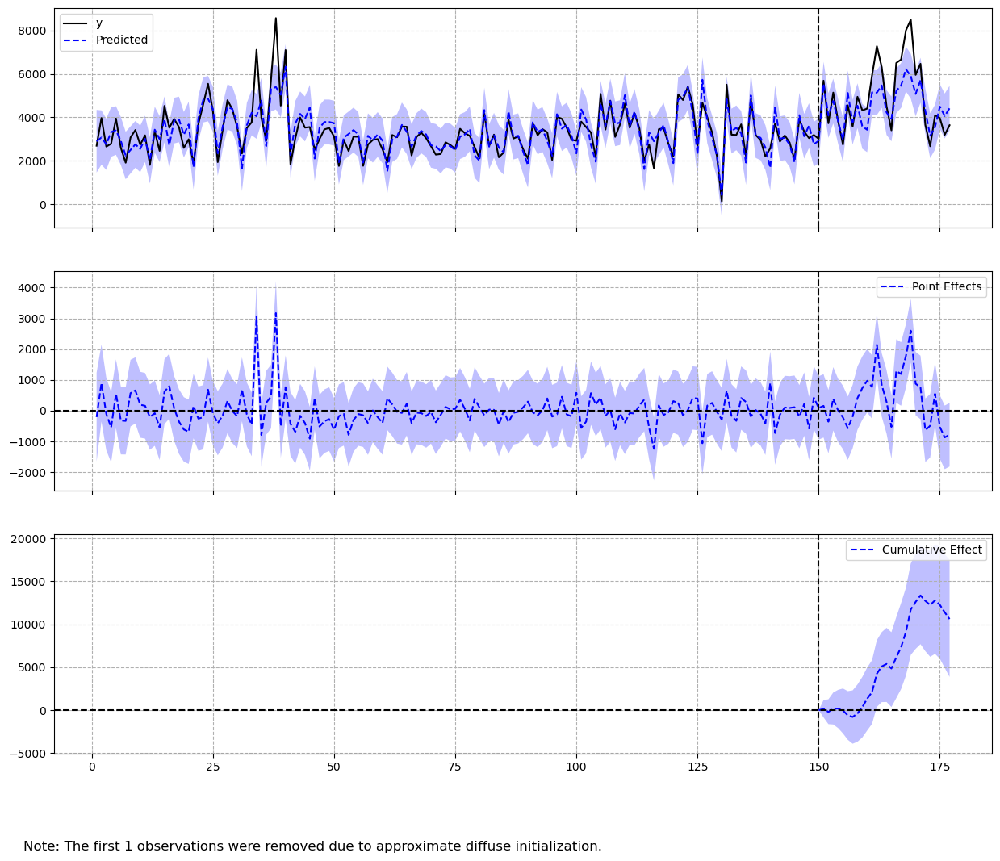

In [354]:
impact.plot()

In [356]:
print(impact.summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    4949.7             133642.0
Prediction (s.d.)         4556.52 (128.86)   123026.04 (3479.28)
95% CI                    [4300.84, 4805.97] [116122.55, 129761.08]

Absolute effect (s.d.)    393.18 (128.86)    10615.96 (3479.28)
95% CI                    [143.74, 648.87]   [3880.92, 17519.45]

Relative effect (s.d.)    8.63% (2.83%)      8.63% (2.83%)
95% CI                    [3.15%, 14.24%]    [3.15%, 14.24%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))


## Stationary Test
### ADFuller Test 
Unit root test. If p-value is small enough, it can be stationary

In [360]:
from statsmodels.tsa.stattools import adfuller

itemslist = list(dfhistorical.item_name.unique())

for item in itemslist:
    datah = dfhistorical[dfhistorical.item_name==item]
    result = adfuller(datah['total_amount_sold'])
    print('\n' + item)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])



JIM BEAM
ADF Statistic: -9.470536
p-value: 0.000000

BLACK VELVET
ADF Statistic: -19.102148
p-value: 0.000000

HAWKEYE VODKA
ADF Statistic: -27.967665
p-value: 0.000000

FIVE O'CLOCK VODKA
ADF Statistic: -14.505927
p-value: 0.000000

TITOS HANDMADE VODKA
ADF Statistic: -21.514724
p-value: 0.000000

CAPTAIN MORGAN SPICED RUM
ADF Statistic: -29.816119
p-value: 0.000000

FIREBALL CINNAMON WHISKEY
ADF Statistic: -28.544899
p-value: 0.000000


### Autocorrelation test with plot
Autocorrelation (ACF) is a calculated value used to represent how similar a value within a time series is to a previous value. If there are some points out of the confidence interval(>0.95), it can have autocorrelation. 

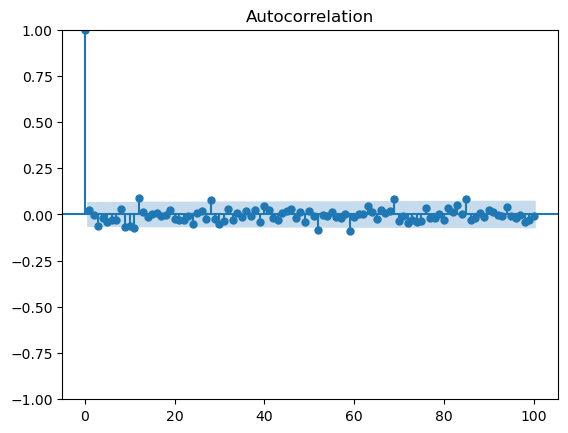

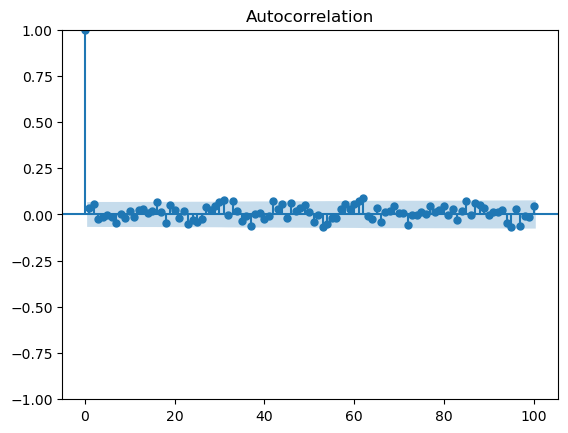

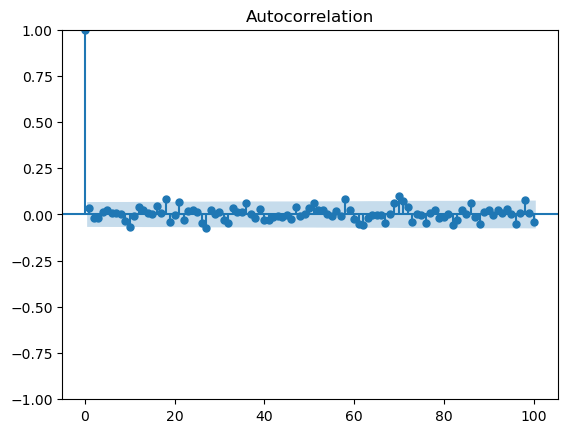

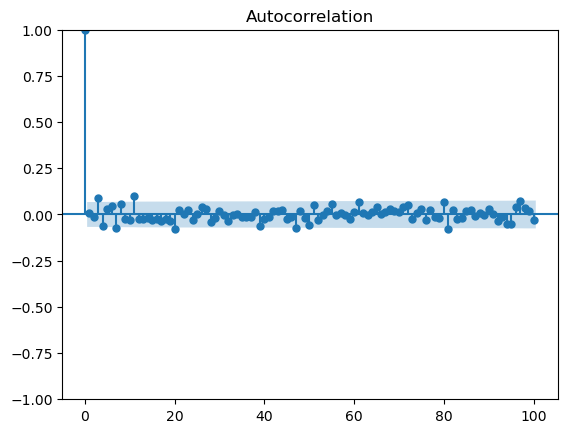

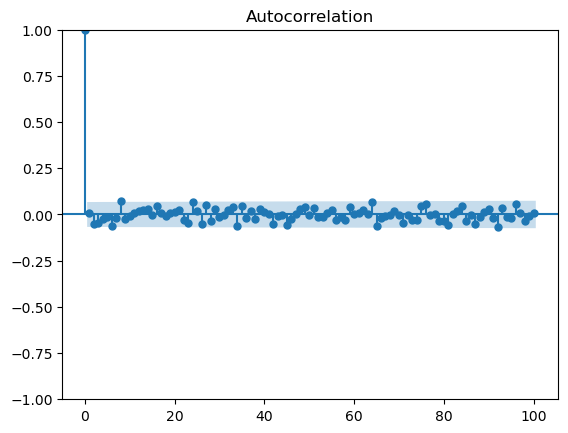

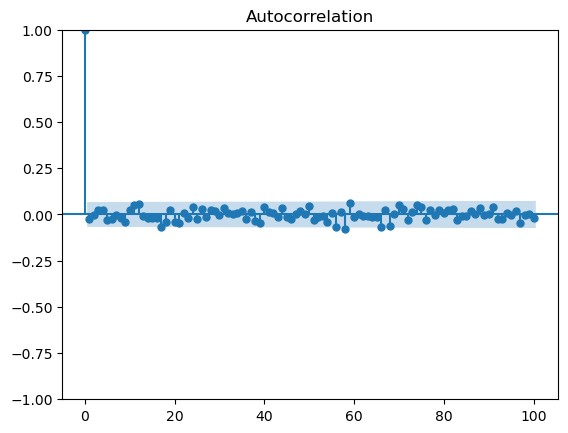

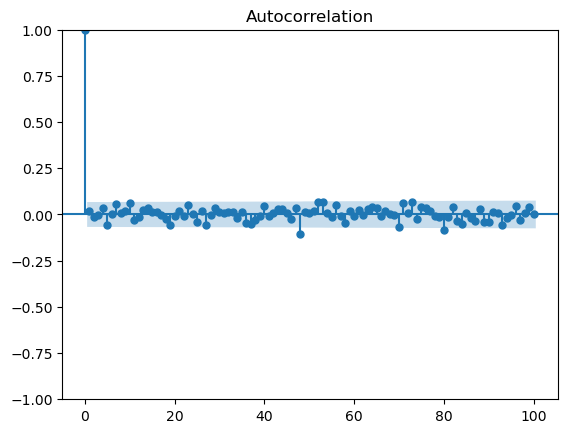

In [364]:
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

for item in itemslist:
    datah = dfhistorical[dfhistorical.item_name==item]
    plot_acf(datah['total_amount_sold'], lags=100)
    plt.show()

### Note
1. Google ML Developer Programs team supported this work by providing Google Cloud Credit.
2. This notebook is based on [Google BigQuery Example](https://github.com/GoogleCloudPlatform/analytics-componentized-patterns/blob/master/retail/time-series/bqml-demand-forecasting/bqml_retail_demand_forecasting.ipynb)